In [1]:
# import os

# os.environ["KERAS_BACKEND"] = "tensorflow"

# Setting random seed to obtain reproducible results.
import tensorflow as tf

tf.random.set_seed(42)

import keras
from keras import layers

import os
import glob
import imageio.v2 as imageio
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

# Initialize global variables.
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 5
# NUM_SAMPLES = 32
POS_ENCODE_DIMS = 16
EPOCHS = 100

NUM_SAMPLES_COARSE = 32
NUM_SAMPLES_FINE_IMPORTANCE = 32


2025-05-12 07:27:25.826950: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-12 07:27:25.870278: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-12 07:27:26.490386: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
# Download the data if it does not already exist.
url = (
    "http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz"
)
data = tf.keras.utils.get_file(origin=url)

data = np.load(data)
images = data["images"]
im_shape = images.shape
(num_images, H, W, _) = images.shape
(poses, focal) = (data["poses"], data["focal"])

# Plot a random image from the dataset for visualization.
# plt.imshow(images[np.random.randint(low=0, high=num_images)])
# plt.show()

In [3]:
def sample_pdf(bins, weights, N_samples, det=False):
    weights = weights + 1e-5
    pdf = weights / tf.reduce_sum(weights, axis=-1, keepdims=True)
    cdf = tf.cumsum(pdf, axis=-1)
    cdf = tf.concat([tf.zeros_like(cdf[..., :1]), cdf], axis=-1)

    if det:
        u = tf.linspace(0.0, 1.0, N_samples)
        u_shape = tf.concat([tf.shape(cdf)[:-1], [N_samples]], axis=0)
        u = tf.broadcast_to(u, u_shape)
    else:
        u_shape = tf.concat([tf.shape(cdf)[:-1], [N_samples]], axis=0)
        u = tf.random.uniform(u_shape)

    inds = tf.searchsorted(cdf, u, side='right')

    below = tf.maximum(0, inds - 1)
    above = tf.minimum(tf.shape(cdf)[-1] - 1, inds)
    inds_g = tf.stack([below, above], axis=-1)

    batch_dims_for_gather = cdf.shape.rank - 1
    if batch_dims_for_gather < 0: # rank가 None일 경우 대비
        # 이 경우, 입력 데이터의 일반적인 배치 차원 수를 가정해야 합니다.
        # 예를 들어 (B, H, W, N_points) 형태라면 배치 차원은 3개.
        # 이 값은 컨텍스트에 따라 달라지므로 주의해야 합니다.
        # 보다 안전하게는, 이 함수를 호출하는 부분에서 batch_dims를 명시적으로 계산하여 전달하거나,
        # 또는 입력 텐서의 정적 shape이 보장되도록 해야 합니다.
        # 여기서는 일단 0 이상으로 가정하고 진행합니다. (에러 방지 목적)
        # 실제로는 이 분기에 들어오지 않도록 shape 관리가 필요합니다.
        batch_dims_for_gather = tf.maximum(0, tf.rank(cdf) -1)


    # bins와 cdf의 배치 차원 수가 동일하다고 가정합니다.
    # 만약 bins.shape.rank가 None이면, cdf와 동일한 batch_dims 사용 시도
    if bins.shape.rank is not None and cdf.shape.rank is not None and bins.shape.rank != cdf.shape.rank:
        # 이 경우, gather 연산을 위해 batch_dims를 어떻게 설정할지 더 신중한 고려가 필요.
        # 여기서는 cdf의 batch_dims를 기준으로 함.
        pass


    cdf_g = tf.gather(cdf, inds_g, batch_dims=batch_dims_for_gather)
    bins_g = tf.gather(bins, inds_g, batch_dims=batch_dims_for_gather)

    denom = cdf_g[..., 1] - cdf_g[..., 0]
    denom = tf.where(denom < 1e-5, tf.ones_like(denom), denom)
    t = (u - cdf_g[..., 0]) / denom
    samples = bins_g[..., 0] + t * (bins_g[..., 1] - bins_g[..., 0])
    return samples

In [4]:

def encode_position(x):
    """Encodes the position into its corresponding Fourier feature.

    Args:
        x: The input coordinate.

    Returns:
        Fourier features tensors of the position.
    """
    positions = [x]
    for i in range(POS_ENCODE_DIMS):
        for fn in [tf.sin, tf.cos]:
            positions.append(fn(2.0**i * x))
    return tf.concat(positions, axis=-1)


def get_rays(height, width, focal, pose):
    """Computes origin point and direction vector of rays.

    Args:
        height: Height of the image.
        width: Width of the image.
        focal: The focal length between the images and the camera.
        pose: The pose matrix of the camera.

    Returns:
        Tuple of origin point and direction vector for rays.
    """
    # Build a meshgrid for the rays.
    i, j = tf.meshgrid(
        tf.range(width, dtype=tf.float32),
        tf.range(height, dtype=tf.float32),
        indexing="xy",
    )

    # Normalize the x axis coordinates.
    transformed_i = (i - width * 0.5) / focal

    # Normalize the y axis coordinates.
    transformed_j = (j - height * 0.5) / focal

    # Create the direction unit vectors.
    directions = tf.stack([transformed_i, -transformed_j, -tf.ones_like(i)], axis=-1)

    # Get the camera matrix.
    camera_matrix = pose[:3, :3]
    height_width_focal = pose[:3, -1]

    # Get origins and directions for the rays.
    transformed_dirs = directions[..., None, :]
    camera_dirs = transformed_dirs * camera_matrix
    ray_directions = tf.reduce_sum(camera_dirs, axis=-1)
    ray_origins = tf.broadcast_to(height_width_focal, tf.shape(ray_directions))

    # Return the origins and directions.
    return (ray_origins, ray_directions)

def render_flat_rays_for_coarse(ray_origins, ray_directions, near, far, num_samples, perturb=False):
    if perturb:
        shape_prefix = tf.shape(ray_origins)[:-1]
        bin_starts_flat = tf.linspace(near, far, num_samples + 1)[:-1]
        
        shape_prefix_dims_len = tf.rank(ray_origins) - 1
        view_shape_for_linspace = tf.concat([tf.ones(shape_prefix_dims_len, dtype=tf.int32), [num_samples]], axis=0)
        bin_starts_b = tf.reshape(bin_starts_flat, view_shape_for_linspace)
        
        bin_width = (far - near) / num_samples
        
        rand_shape = tf.concat([shape_prefix, [num_samples]], axis=0)
        random_offsets = tf.random.uniform(shape=rand_shape) * bin_width
        
        t_vals_shaped = bin_starts_b + random_offsets
    else:
        _t_vals_flat = tf.linspace(near, far, num_samples)
        shape_prefix = tf.shape(ray_origins)[:-1]
        t_vals_shaped = tf.broadcast_to(_t_vals_flat, tf.concat([shape_prefix, [num_samples]], axis=0))

    rays = ray_origins[..., None, :] + (
        ray_directions[..., None, :] * t_vals_shaped[..., None]
    )
    
    rays_flat = tf.reshape(rays, [-1, 3])
    rays_flat_encoded = encode_position(rays_flat)
    
    return (rays_flat_encoded, t_vals_shaped)

def map_fn(pose):
    (ray_origins, ray_directions) = get_rays(height=H, width=W, focal=focal, pose=pose)
    return (ray_origins, ray_directions)

# Create the training split.
split_index = int(num_images * 0.8)

# Split the images into training and validation.
train_images = images[:split_index]
val_images = images[split_index:]

# Split the poses into training and validation.
train_poses = poses[:split_index]
val_poses = poses[split_index:]

# Make the training pipeline.
train_img_ds = tf.data.Dataset.from_tensor_slices(train_images)
train_pose_ds = tf.data.Dataset.from_tensor_slices(train_poses)
train_ray_ds = train_pose_ds.map(map_fn, num_parallel_calls=AUTO)
training_ds = tf.data.Dataset.zip((train_img_ds, train_ray_ds))
train_ds = (
    training_ds.shuffle(BATCH_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True, num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

# Make the validation pipeline.
val_img_ds = tf.data.Dataset.from_tensor_slices(val_images)
val_pose_ds = tf.data.Dataset.from_tensor_slices(val_poses)
val_ray_ds = val_pose_ds.map(map_fn, num_parallel_calls=AUTO)
validation_ds = tf.data.Dataset.zip((val_img_ds, val_ray_ds))
val_ds = (
    validation_ds.shuffle(BATCH_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True, num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

2025-05-12 07:27:34.520090: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 28622 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:2a:00.0, compute capability: 8.6
2025-05-12 07:27:34.520790: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 837 MB memory:  -> device: 1, name: NVIDIA RTX A6000, pci bus id: 0000:3d:00.0, compute capability: 8.6
2025-05-12 07:27:34.521169: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 32714 MB memory:  -> device: 2, name: NVIDIA RTX A6000, pci bus id: 0000:cf:00.0, compute capability: 8.6


In [5]:
# 전역 변수 (첫 번째 셀에서 정의되었다고 가정)
# POS_ENCODE_DIMS, BATCH_SIZE
# NUM_SAMPLES_COARSE, NUM_SAMPLES_FINE_IMPORTANCE
# H, W (데이터 로드 시 결정)

# 단일 인코딩된 좌표의 차원 수
SINGLE_COORD_ENCODED_DIMS = 2 * 3 * POS_ENCODE_DIMS + 3

def get_nerf_model_modified(num_layers, encoded_dims_per_coord):
    inputs = keras.Input(shape=(encoded_dims_per_coord,))
    x = inputs
    for i in range(num_layers):
        x = layers.Dense(units=64, activation="relu")(x)
        if i % 4 == 0 and i > 0:
            x = layers.concatenate([x, inputs], axis=-1)
    outputs = layers.Dense(units=4)(x)
    return keras.Model(inputs=inputs, outputs=outputs)

def render_rays_hierarchical(
    model_coarse,
    model_fine,
    ray_origins,
    ray_directions,
    near,
    far,
    perturb_coarse=True,
    train=True # 이 train 인자를 모델 호출 시 training 인자로 사용
    ):

    current_batch_size = tf.shape(ray_origins)[0]
    h_dim = tf.shape(ray_origins)[1]
    w_dim = tf.shape(ray_origins)[2]

    rays_flat_coarse_encoded, t_vals_coarse = render_flat_rays_for_coarse(
        ray_origins, ray_directions, near, far, NUM_SAMPLES_COARSE, perturb=perturb_coarse
    )

    # 모델 호출 시 .predict() 대신 직접 호출하고 training 인자 전달
    predictions_coarse_flat = model_coarse(rays_flat_coarse_encoded, training=train)

    predictions_coarse = tf.reshape(
        predictions_coarse_flat,
        shape=(current_batch_size, h_dim, w_dim, NUM_SAMPLES_COARSE, 4)
    )

    rgb_coarse_samples = tf.sigmoid(predictions_coarse[..., :-1])
    sigma_a_coarse_samples = tf.nn.relu(predictions_coarse[..., -1])

    delta_coarse = t_vals_coarse[..., 1:] - t_vals_coarse[..., :-1]
    delta_coarse = tf.concat(
        [delta_coarse, tf.broadcast_to([1e10], shape=tf.concat([tf.shape(delta_coarse)[:-1],[1]], axis=0) )], axis=-1
    )

    alpha_coarse = 1.0 - tf.exp(-sigma_a_coarse_samples * delta_coarse)
    epsilon = 1e-10
    transmittance_coarse = tf.math.cumprod(1.0 - alpha_coarse + epsilon, axis=-1, exclusive=True)
    weights_coarse = alpha_coarse * transmittance_coarse

    rgb_coarse = tf.reduce_sum(weights_coarse[..., None] * rgb_coarse_samples, axis=-2)
    depth_coarse = tf.reduce_sum(weights_coarse * t_vals_coarse, axis=-1)
    acc_coarse = tf.reduce_sum(weights_coarse, axis=-1)

    t_vals_mid_coarse = .5 * (t_vals_coarse[..., 1:] + t_vals_coarse[..., :-1])
    weights_for_pdf = weights_coarse[..., :-1]

    t_samples_fine_importance = sample_pdf(
        bins=t_vals_mid_coarse,
        weights=weights_for_pdf,
        N_samples=NUM_SAMPLES_FINE_IMPORTANCE,
        det=not train
    )
    t_samples_fine_importance = tf.stop_gradient(t_samples_fine_importance)

    t_vals_fine_combined = tf.sort(
        tf.concat([t_vals_coarse, t_samples_fine_importance], axis=-1), axis=-1
    )

    rays_fine = ray_origins[..., None, :] + (
        ray_directions[..., None, :] * t_vals_fine_combined[..., None]
    )
    
    rays_fine_flat = tf.reshape(rays_fine, [-1, 3])
    rays_fine_flat_encoded = encode_position(rays_fine_flat)

    # 모델 호출 시 .predict() 대신 직접 호출하고 training 인자 전달
    predictions_fine_flat = model_fine(rays_fine_flat_encoded, training=train)
    
    num_total_fine_samples = NUM_SAMPLES_COARSE + NUM_SAMPLES_FINE_IMPORTANCE
    predictions_fine = tf.reshape(
        predictions_fine_flat,
        shape=(current_batch_size, h_dim, w_dim, num_total_fine_samples, 4)
    )

    rgb_fine_samples = tf.sigmoid(predictions_fine[..., :-1])
    sigma_a_fine_samples = tf.nn.relu(predictions_fine[..., -1])

    delta_fine = t_vals_fine_combined[..., 1:] - t_vals_fine_combined[..., :-1]
    delta_fine = tf.concat(
        [delta_fine, tf.broadcast_to([1e10], shape=tf.concat([tf.shape(delta_fine)[:-1],[1]], axis=0))], axis=-1
    )

    alpha_fine = 1.0 - tf.exp(-sigma_a_fine_samples * delta_fine)
    transmittance_fine = tf.math.cumprod(1.0 - alpha_fine + epsilon, axis=-1, exclusive=True)
    weights_fine = alpha_fine * transmittance_fine

    rgb_fine = tf.reduce_sum(weights_fine[..., None] * rgb_fine_samples, axis=-2)
    depth_fine = tf.reduce_sum(weights_fine * t_vals_fine_combined, axis=-1)
    acc_fine = tf.reduce_sum(weights_fine, axis=-1)
    
    extras = {
        "rgb_coarse": rgb_coarse,
        "depth_coarse": depth_coarse,
        "acc_coarse": acc_coarse,
        "acc_fine": acc_fine,
    }

    return rgb_fine, depth_fine, extras

Epoch 1/100


2025-05-12 07:27:37.820977: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2025-05-12 07:27:37.869456: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f76e3be9ed0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-12 07:27:37.869506: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
2025-05-12 07:27:37.869515: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (1): NVIDIA RTX A6000, Compute Capability 8.6
2025-05-12 07:27:37.869521: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (2): NVIDIA RTX A6000, Compute Capability 8.6
2025-05-12 07:27:37.874701: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to ena

16/16 [==============================] - ETA: 0s - loss: 0.2351 - coarse_loss: 0.1101 - fine_loss: 0.1064 - coarse_psnr: 9.6728 - psnr: 9.7079

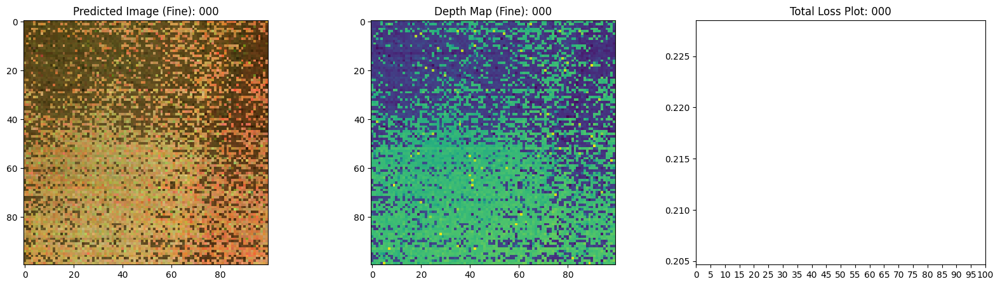

16/16 [==============================] - 10s 419ms/step - loss: 0.2341 - coarse_loss: 0.1101 - fine_loss: 0.1064 - coarse_psnr: 9.6728 - psnr: 9.7130 - val_loss: 0.1688 - val_coarse_loss: 0.0848 - val_fine_loss: 0.0840 - val_coarse_psnr: 10.8162 - val_psnr: 10.8298
Epoch 2/100
16/16 [==============================] - ETA: 0s - loss: 0.1441 - coarse_loss: 0.0688 - fine_loss: 0.0676 - coarse_psnr: 11.9745 - psnr: 11.5791

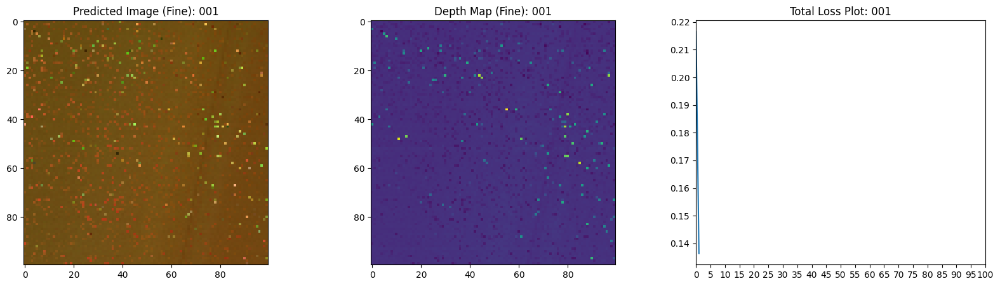

16/16 [==============================] - 6s 396ms/step - loss: 0.1436 - coarse_loss: 0.0688 - fine_loss: 0.0676 - coarse_psnr: 11.9745 - psnr: 11.6040 - val_loss: 0.1441 - val_coarse_loss: 0.0714 - val_fine_loss: 0.0727 - val_coarse_psnr: 11.9604 - val_psnr: 11.9008
Epoch 3/100
16/16 [==============================] - ETA: 0s - loss: 0.1214 - coarse_loss: 0.0609 - fine_loss: 0.0606 - coarse_psnr: 12.5782 - psnr: 12.5990

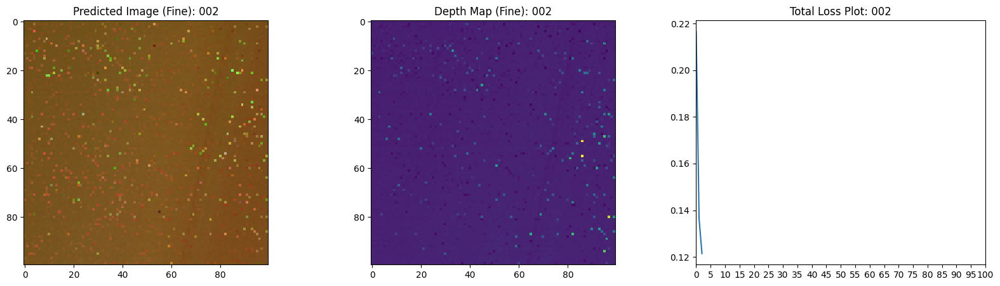

16/16 [==============================] - 6s 386ms/step - loss: 0.1214 - coarse_loss: 0.0609 - fine_loss: 0.0606 - coarse_psnr: 12.5782 - psnr: 12.6020 - val_loss: 0.1366 - val_coarse_loss: 0.0669 - val_fine_loss: 0.0696 - val_coarse_psnr: 12.0773 - val_psnr: 11.9929
Epoch 4/100
16/16 [==============================] - ETA: 0s - loss: 0.1166 - coarse_loss: 0.0592 - fine_loss: 0.0592 - coarse_psnr: 12.6753 - psnr: 12.7112

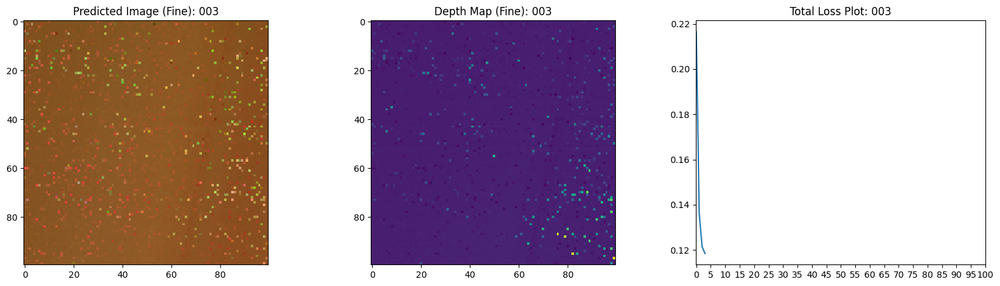

16/16 [==============================] - 6s 386ms/step - loss: 0.1168 - coarse_loss: 0.0592 - fine_loss: 0.0592 - coarse_psnr: 12.6753 - psnr: 12.7079 - val_loss: 0.1322 - val_coarse_loss: 0.0640 - val_fine_loss: 0.0682 - val_coarse_psnr: 12.3343 - val_psnr: 12.1012
Epoch 5/100
16/16 [==============================] - ETA: 0s - loss: 0.1129 - coarse_loss: 0.0575 - fine_loss: 0.0586 - coarse_psnr: 12.8095 - psnr: 12.8393

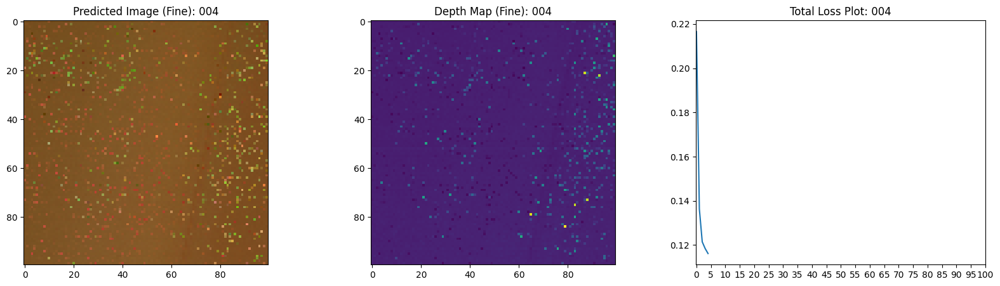

16/16 [==============================] - 6s 387ms/step - loss: 0.1131 - coarse_loss: 0.0575 - fine_loss: 0.0586 - coarse_psnr: 12.8095 - psnr: 12.8343 - val_loss: 0.1298 - val_coarse_loss: 0.0612 - val_fine_loss: 0.0687 - val_coarse_psnr: 12.5046 - val_psnr: 12.0278
Epoch 6/100
16/16 [==============================] - ETA: 0s - loss: 0.1123 - coarse_loss: 0.0541 - fine_loss: 0.0581 - coarse_psnr: 13.0617 - psnr: 12.7789

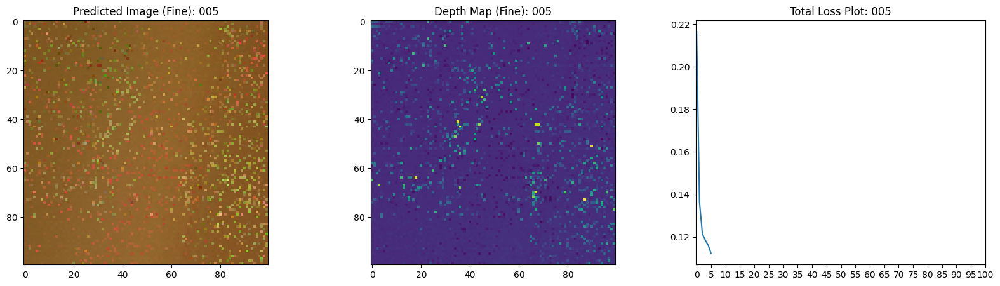

16/16 [==============================] - 6s 389ms/step - loss: 0.1123 - coarse_loss: 0.0541 - fine_loss: 0.0581 - coarse_psnr: 13.0617 - psnr: 12.7780 - val_loss: 0.1267 - val_coarse_loss: 0.0562 - val_fine_loss: 0.0705 - val_coarse_psnr: 12.8669 - val_psnr: 11.8896
Epoch 7/100
16/16 [==============================] - ETA: 0s - loss: 0.1006 - coarse_loss: 0.0461 - fine_loss: 0.0552 - coarse_psnr: 13.7622 - psnr: 13.0455

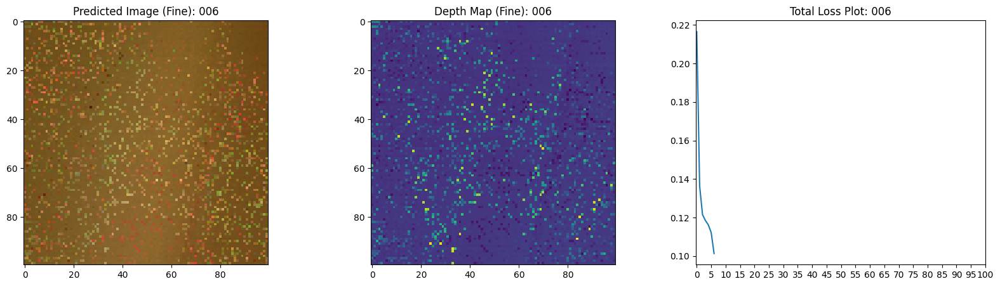

16/16 [==============================] - 6s 388ms/step - loss: 0.1006 - coarse_loss: 0.0461 - fine_loss: 0.0552 - coarse_psnr: 13.7622 - psnr: 13.0429 - val_loss: 0.1120 - val_coarse_loss: 0.0452 - val_fine_loss: 0.0669 - val_coarse_psnr: 13.6481 - val_psnr: 12.0701
Epoch 8/100
16/16 [==============================] - ETA: 0s - loss: 0.0912 - coarse_loss: 0.0388 - fine_loss: 0.0529 - coarse_psnr: 14.4344 - psnr: 13.2076

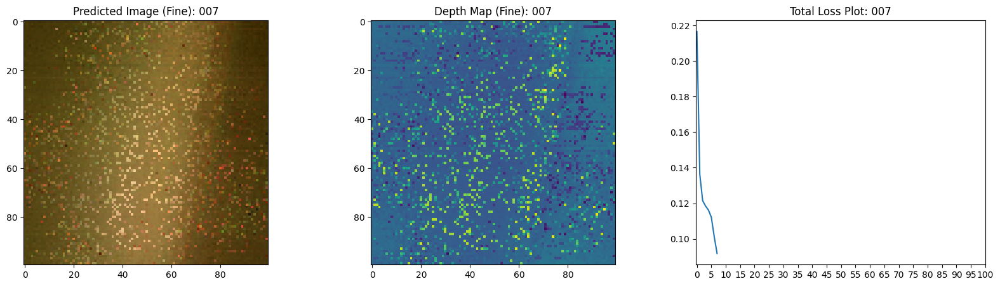

16/16 [==============================] - 6s 388ms/step - loss: 0.0912 - coarse_loss: 0.0388 - fine_loss: 0.0529 - coarse_psnr: 14.4344 - psnr: 13.2068 - val_loss: 0.0931 - val_coarse_loss: 0.0355 - val_fine_loss: 0.0576 - val_coarse_psnr: 14.7250 - val_psnr: 12.7232
Epoch 9/100
16/16 [==============================] - ETA: 0s - loss: 0.0808 - coarse_loss: 0.0331 - fine_loss: 0.0471 - coarse_psnr: 15.0495 - psnr: 13.6162

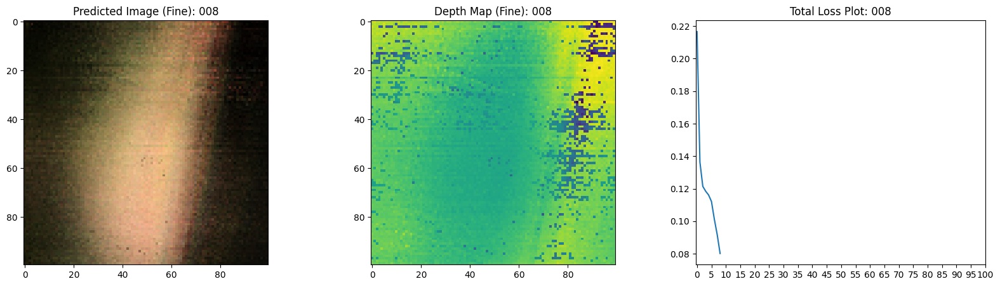

16/16 [==============================] - 6s 389ms/step - loss: 0.0808 - coarse_loss: 0.0331 - fine_loss: 0.0471 - coarse_psnr: 15.0495 - psnr: 13.6208 - val_loss: 0.0849 - val_coarse_loss: 0.0337 - val_fine_loss: 0.0512 - val_coarse_psnr: 14.8563 - val_psnr: 13.1823
Epoch 10/100
16/16 [==============================] - ETA: 0s - loss: 0.0712 - coarse_loss: 0.0306 - fine_loss: 0.0386 - coarse_psnr: 15.3653 - psnr: 14.3092

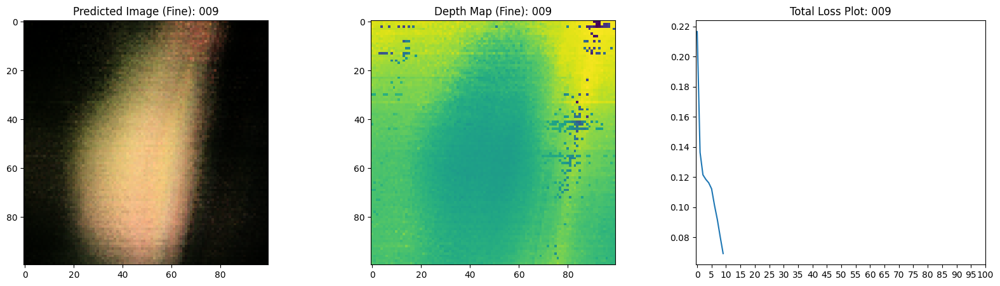

16/16 [==============================] - 6s 390ms/step - loss: 0.0711 - coarse_loss: 0.0306 - fine_loss: 0.0386 - coarse_psnr: 15.3653 - psnr: 14.3225 - val_loss: 0.0680 - val_coarse_loss: 0.0301 - val_fine_loss: 0.0379 - val_coarse_psnr: 15.3837 - val_psnr: 14.4453
Epoch 11/100
16/16 [==============================] - ETA: 0s - loss: 0.0624 - coarse_loss: 0.0294 - fine_loss: 0.0315 - coarse_psnr: 15.5363 - psnr: 15.1348

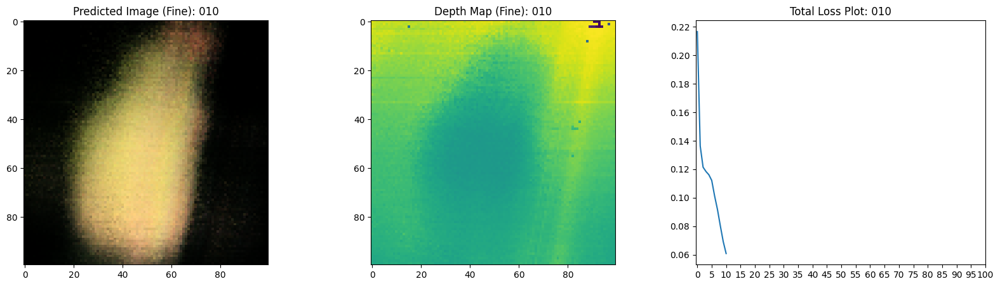

16/16 [==============================] - 6s 403ms/step - loss: 0.0624 - coarse_loss: 0.0294 - fine_loss: 0.0315 - coarse_psnr: 15.5363 - psnr: 15.1464 - val_loss: 0.0590 - val_coarse_loss: 0.0287 - val_fine_loss: 0.0303 - val_coarse_psnr: 15.5808 - val_psnr: 15.3678
Epoch 12/100
16/16 [==============================] - ETA: 0s - loss: 0.0551 - coarse_loss: 0.0269 - fine_loss: 0.0271 - coarse_psnr: 15.8986 - psnr: 15.7779

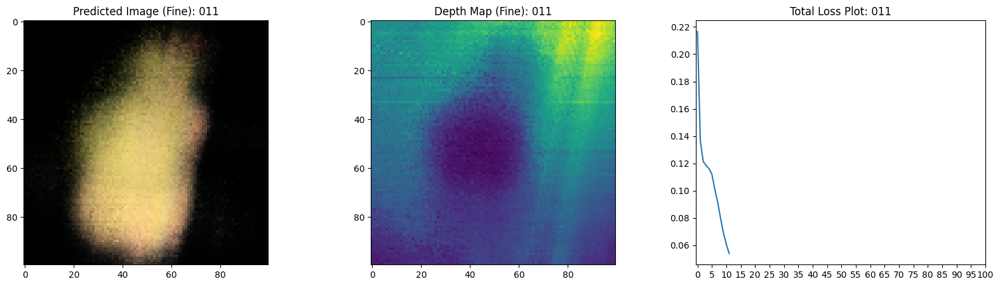

16/16 [==============================] - 6s 389ms/step - loss: 0.0550 - coarse_loss: 0.0269 - fine_loss: 0.0271 - coarse_psnr: 15.8986 - psnr: 15.7869 - val_loss: 0.0581 - val_coarse_loss: 0.0266 - val_fine_loss: 0.0315 - val_coarse_psnr: 15.9088 - val_psnr: 15.2780
Epoch 13/100
16/16 [==============================] - ETA: 0s - loss: 0.0520 - coarse_loss: 0.0256 - fine_loss: 0.0253 - coarse_psnr: 16.1231 - psnr: 16.0695

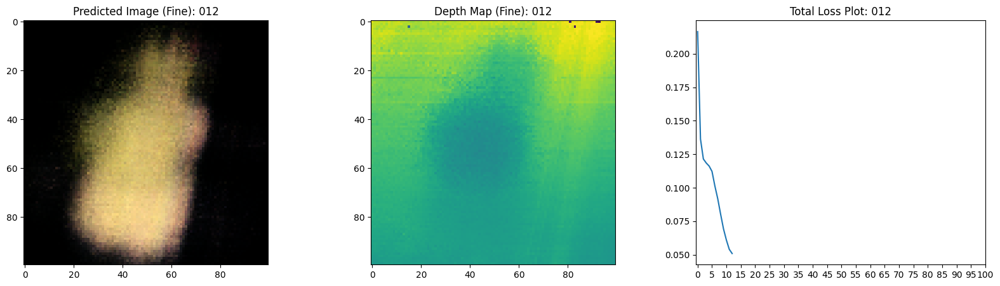

16/16 [==============================] - 6s 388ms/step - loss: 0.0519 - coarse_loss: 0.0256 - fine_loss: 0.0253 - coarse_psnr: 16.1231 - psnr: 16.0781 - val_loss: 0.0530 - val_coarse_loss: 0.0263 - val_fine_loss: 0.0267 - val_coarse_psnr: 15.9259 - val_psnr: 15.9140
Epoch 14/100
16/16 [==============================] - ETA: 0s - loss: 0.0497 - coarse_loss: 0.0245 - fine_loss: 0.0236 - coarse_psnr: 16.3353 - psnr: 16.3235

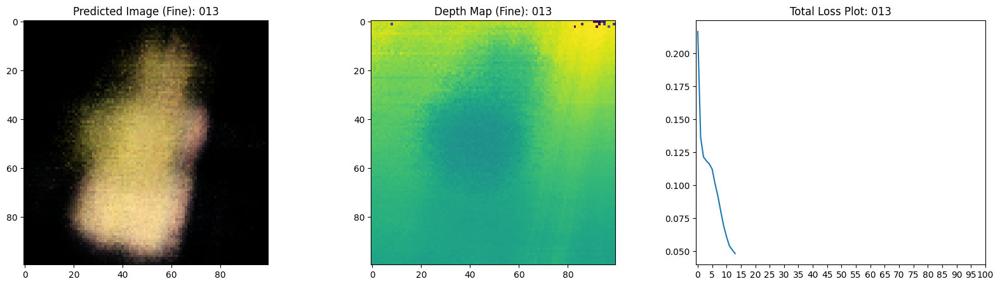

16/16 [==============================] - 6s 393ms/step - loss: 0.0496 - coarse_loss: 0.0245 - fine_loss: 0.0236 - coarse_psnr: 16.3353 - psnr: 16.3335 - val_loss: 0.0486 - val_coarse_loss: 0.0250 - val_fine_loss: 0.0236 - val_coarse_psnr: 16.1449 - val_psnr: 16.3659
Epoch 15/100
16/16 [==============================] - ETA: 0s - loss: 0.0448 - coarse_loss: 0.0224 - fine_loss: 0.0213 - coarse_psnr: 16.6951 - psnr: 16.7822

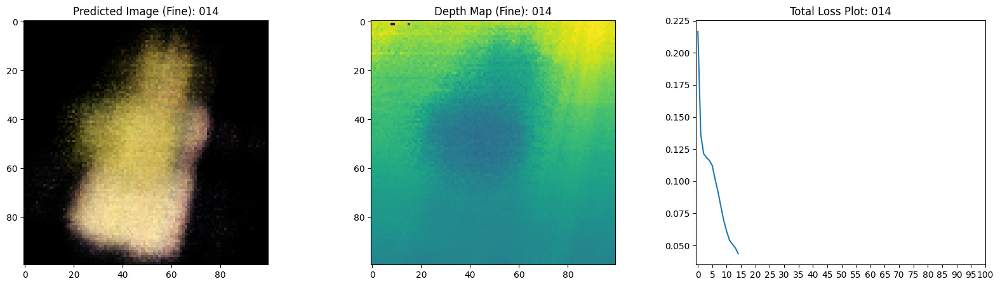

16/16 [==============================] - 6s 394ms/step - loss: 0.0447 - coarse_loss: 0.0224 - fine_loss: 0.0213 - coarse_psnr: 16.6951 - psnr: 16.7897 - val_loss: 0.0429 - val_coarse_loss: 0.0221 - val_fine_loss: 0.0208 - val_coarse_psnr: 16.6430 - val_psnr: 16.8999
Epoch 16/100
16/16 [==============================] - ETA: 0s - loss: 0.0417 - coarse_loss: 0.0211 - fine_loss: 0.0201 - coarse_psnr: 16.9222 - psnr: 17.0575

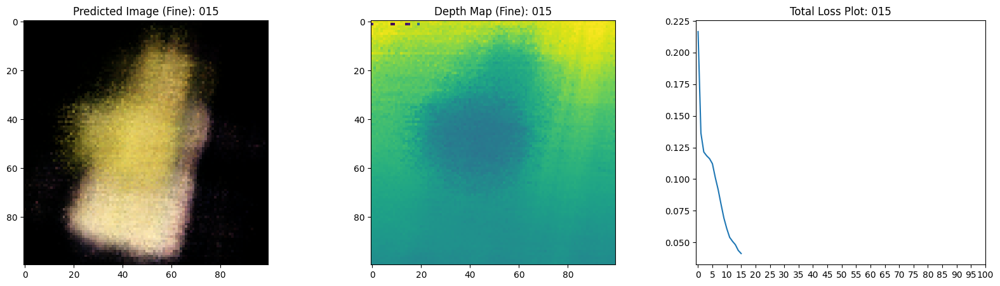

16/16 [==============================] - 6s 393ms/step - loss: 0.0417 - coarse_loss: 0.0211 - fine_loss: 0.0201 - coarse_psnr: 16.9222 - psnr: 17.0625 - val_loss: 0.0417 - val_coarse_loss: 0.0206 - val_fine_loss: 0.0210 - val_coarse_psnr: 16.9547 - val_psnr: 16.8540
Epoch 17/100
16/16 [==============================] - ETA: 0s - loss: 0.0418 - coarse_loss: 0.0215 - fine_loss: 0.0201 - coarse_psnr: 16.8359 - psnr: 17.0269

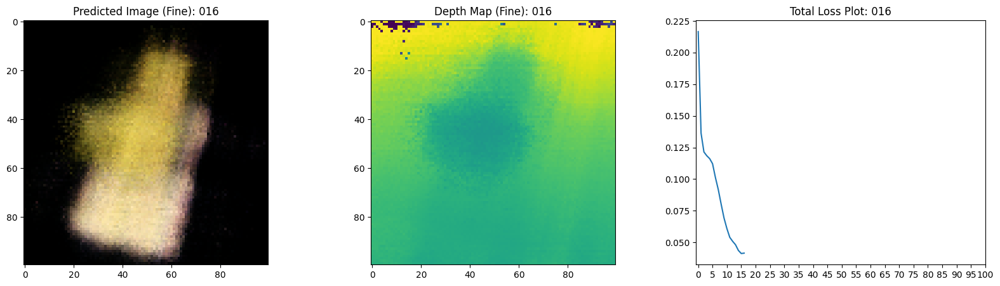

16/16 [==============================] - 6s 392ms/step - loss: 0.0418 - coarse_loss: 0.0215 - fine_loss: 0.0201 - coarse_psnr: 16.8359 - psnr: 17.0330 - val_loss: 0.0385 - val_coarse_loss: 0.0198 - val_fine_loss: 0.0187 - val_coarse_psnr: 17.1281 - val_psnr: 17.3429
Epoch 18/100
16/16 [==============================] - ETA: 0s - loss: 0.0394 - coarse_loss: 0.0203 - fine_loss: 0.0180 - coarse_psnr: 17.0981 - psnr: 17.4565

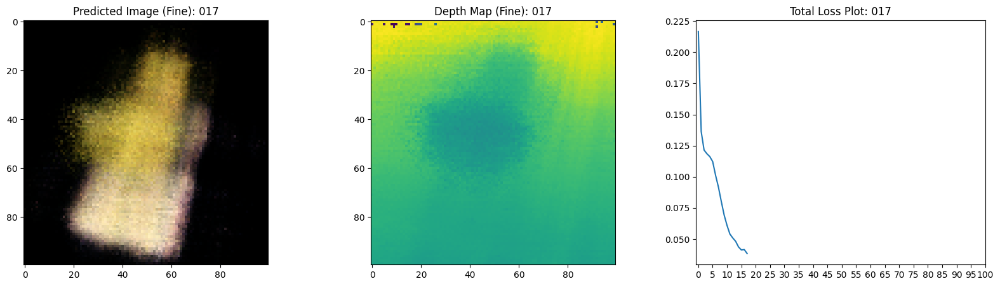

16/16 [==============================] - 6s 391ms/step - loss: 0.0393 - coarse_loss: 0.0203 - fine_loss: 0.0180 - coarse_psnr: 17.0981 - psnr: 17.4645 - val_loss: 0.0377 - val_coarse_loss: 0.0199 - val_fine_loss: 0.0177 - val_coarse_psnr: 17.1042 - val_psnr: 17.5704
Epoch 19/100
16/16 [==============================] - ETA: 0s - loss: 0.0353 - coarse_loss: 0.0187 - fine_loss: 0.0169 - coarse_psnr: 17.4276 - psnr: 17.8936

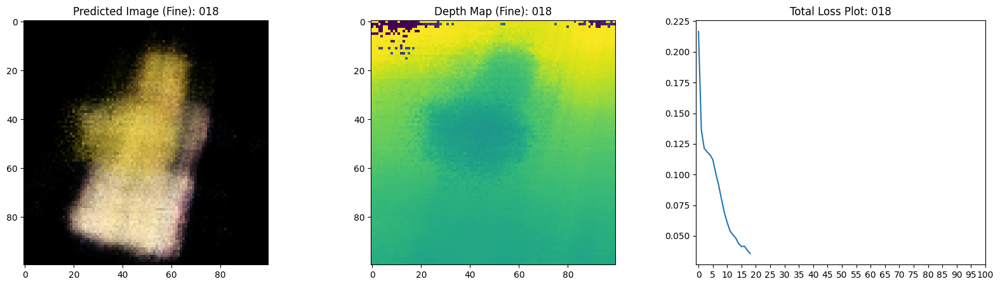

16/16 [==============================] - 6s 392ms/step - loss: 0.0353 - coarse_loss: 0.0187 - fine_loss: 0.0169 - coarse_psnr: 17.4276 - psnr: 17.8924 - val_loss: 0.0358 - val_coarse_loss: 0.0189 - val_fine_loss: 0.0169 - val_coarse_psnr: 17.3232 - val_psnr: 17.7778
Epoch 20/100
16/16 [==============================] - ETA: 0s - loss: 0.0340 - coarse_loss: 0.0179 - fine_loss: 0.0162 - coarse_psnr: 17.6087 - psnr: 18.0473

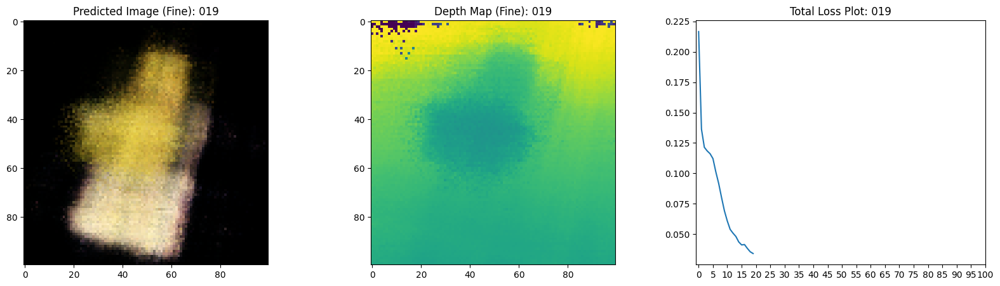

16/16 [==============================] - 6s 395ms/step - loss: 0.0340 - coarse_loss: 0.0179 - fine_loss: 0.0162 - coarse_psnr: 17.6087 - psnr: 18.0472 - val_loss: 0.0344 - val_coarse_loss: 0.0178 - val_fine_loss: 0.0166 - val_coarse_psnr: 17.5575 - val_psnr: 17.8476
Epoch 21/100
16/16 [==============================] - ETA: 0s - loss: 0.0339 - coarse_loss: 0.0177 - fine_loss: 0.0163 - coarse_psnr: 17.6471 - psnr: 18.0194

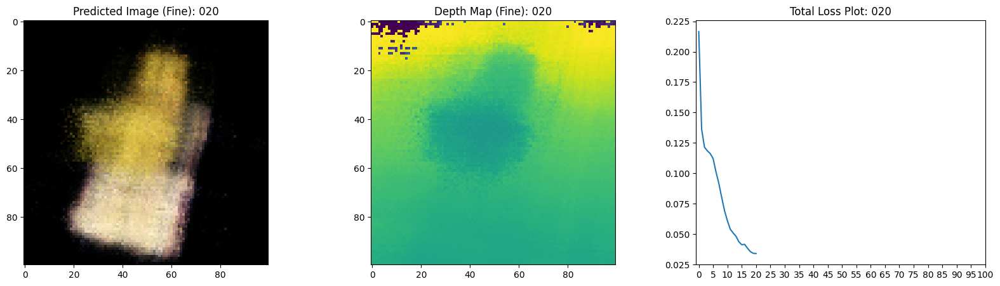

16/16 [==============================] - 6s 405ms/step - loss: 0.0339 - coarse_loss: 0.0177 - fine_loss: 0.0163 - coarse_psnr: 17.6471 - psnr: 18.0205 - val_loss: 0.0332 - val_coarse_loss: 0.0173 - val_fine_loss: 0.0159 - val_coarse_psnr: 17.7300 - val_psnr: 18.0523
Epoch 22/100
16/16 [==============================] - ETA: 0s - loss: 0.0323 - coarse_loss: 0.0169 - fine_loss: 0.0152 - coarse_psnr: 17.8463 - psnr: 18.2692

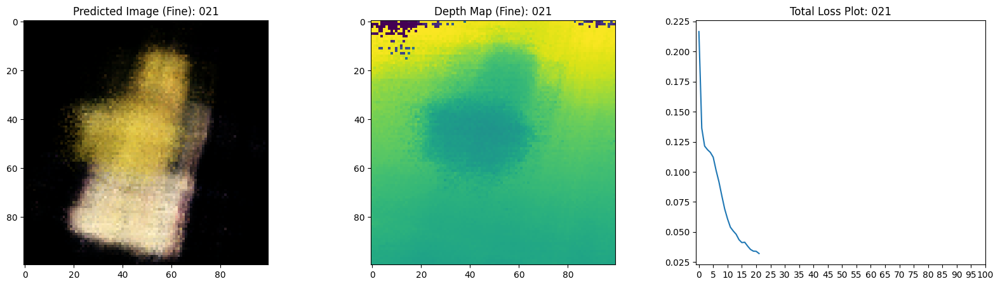

16/16 [==============================] - 6s 391ms/step - loss: 0.0323 - coarse_loss: 0.0169 - fine_loss: 0.0152 - coarse_psnr: 17.8463 - psnr: 18.2719 - val_loss: 0.0322 - val_coarse_loss: 0.0166 - val_fine_loss: 0.0157 - val_coarse_psnr: 17.8905 - val_psnr: 18.0864
Epoch 23/100
16/16 [==============================] - ETA: 0s - loss: 0.0315 - coarse_loss: 0.0167 - fine_loss: 0.0150 - coarse_psnr: 17.9015 - psnr: 18.3681

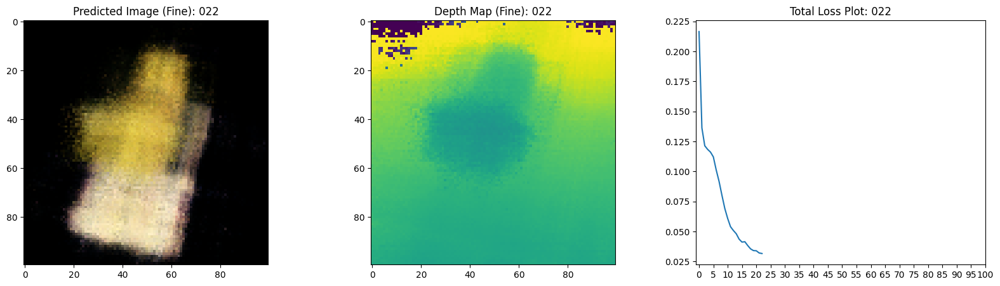

16/16 [==============================] - 6s 394ms/step - loss: 0.0315 - coarse_loss: 0.0167 - fine_loss: 0.0150 - coarse_psnr: 17.9015 - psnr: 18.3688 - val_loss: 0.0310 - val_coarse_loss: 0.0161 - val_fine_loss: 0.0149 - val_coarse_psnr: 18.0305 - val_psnr: 18.3177
Epoch 24/100
16/16 [==============================] - ETA: 0s - loss: 0.0311 - coarse_loss: 0.0162 - fine_loss: 0.0146 - coarse_psnr: 18.0192 - psnr: 18.4350

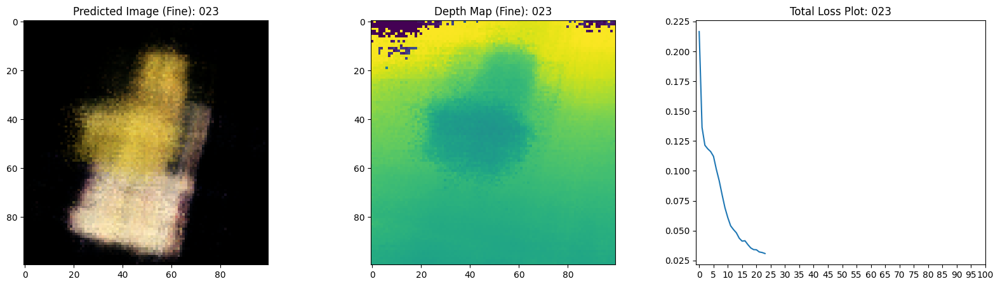

16/16 [==============================] - 6s 393ms/step - loss: 0.0311 - coarse_loss: 0.0162 - fine_loss: 0.0146 - coarse_psnr: 18.0192 - psnr: 18.4380 - val_loss: 0.0311 - val_coarse_loss: 0.0165 - val_fine_loss: 0.0147 - val_coarse_psnr: 17.9247 - val_psnr: 18.3968
Epoch 25/100
16/16 [==============================] - ETA: 0s - loss: 0.0300 - coarse_loss: 0.0157 - fine_loss: 0.0140 - coarse_psnr: 18.1856 - psnr: 18.6312

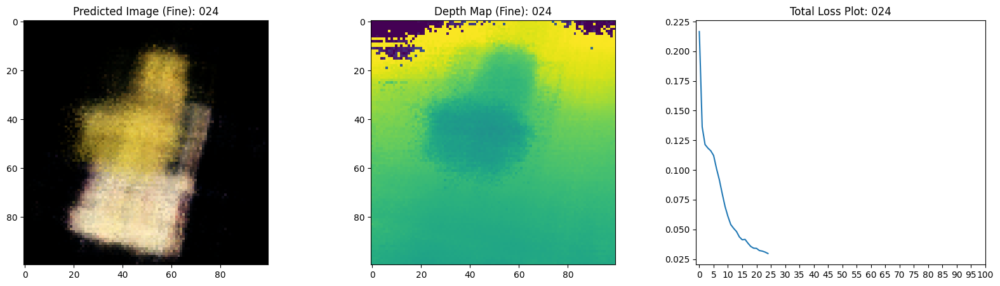

16/16 [==============================] - 6s 393ms/step - loss: 0.0299 - coarse_loss: 0.0157 - fine_loss: 0.0140 - coarse_psnr: 18.1856 - psnr: 18.6342 - val_loss: 0.0296 - val_coarse_loss: 0.0154 - val_fine_loss: 0.0141 - val_coarse_psnr: 18.2115 - val_psnr: 18.5757
Epoch 26/100
16/16 [==============================] - ETA: 0s - loss: 0.0291 - coarse_loss: 0.0154 - fine_loss: 0.0139 - coarse_psnr: 18.2428 - psnr: 18.7519

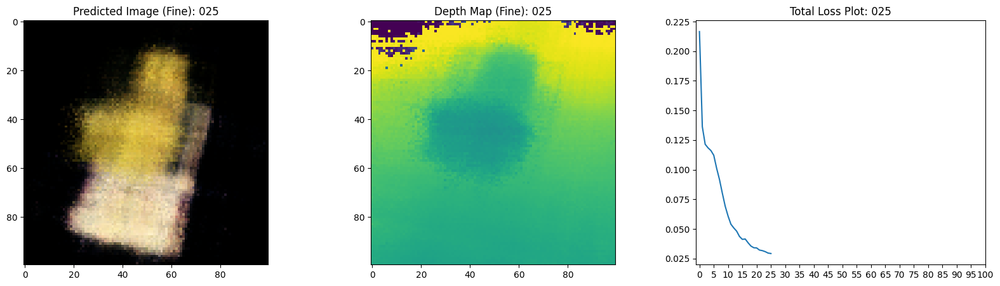

16/16 [==============================] - 6s 392ms/step - loss: 0.0291 - coarse_loss: 0.0154 - fine_loss: 0.0139 - coarse_psnr: 18.2428 - psnr: 18.7505 - val_loss: 0.0295 - val_coarse_loss: 0.0154 - val_fine_loss: 0.0141 - val_coarse_psnr: 18.2523 - val_psnr: 18.5583
Epoch 27/100
16/16 [==============================] - ETA: 0s - loss: 0.0288 - coarse_loss: 0.0152 - fine_loss: 0.0137 - coarse_psnr: 18.3328 - psnr: 18.7578

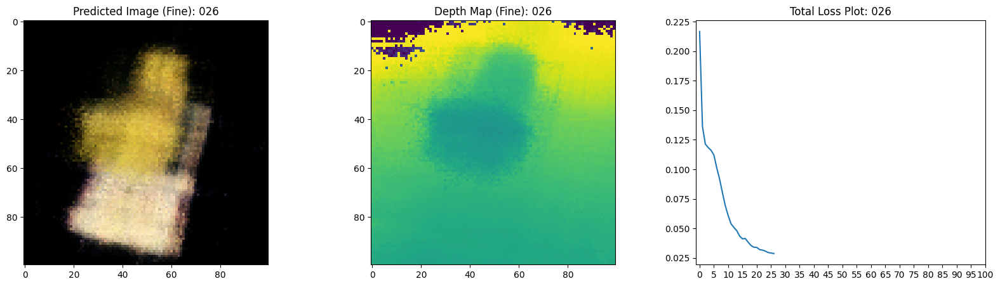

16/16 [==============================] - 6s 395ms/step - loss: 0.0288 - coarse_loss: 0.0152 - fine_loss: 0.0137 - coarse_psnr: 18.3328 - psnr: 18.7600 - val_loss: 0.0286 - val_coarse_loss: 0.0150 - val_fine_loss: 0.0136 - val_coarse_psnr: 18.3113 - val_psnr: 18.7121
Epoch 28/100
16/16 [==============================] - ETA: 0s - loss: 0.0282 - coarse_loss: 0.0150 - fine_loss: 0.0133 - coarse_psnr: 18.3769 - psnr: 18.8815

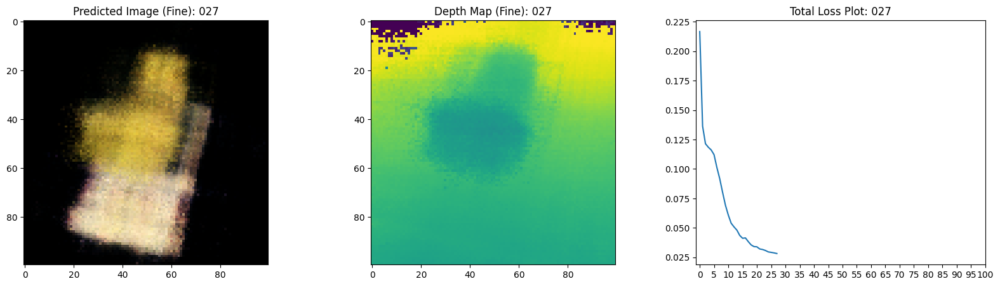

16/16 [==============================] - 6s 394ms/step - loss: 0.0282 - coarse_loss: 0.0150 - fine_loss: 0.0133 - coarse_psnr: 18.3769 - psnr: 18.8828 - val_loss: 0.0283 - val_coarse_loss: 0.0147 - val_fine_loss: 0.0136 - val_coarse_psnr: 18.4481 - val_psnr: 18.7303
Epoch 29/100
16/16 [==============================] - ETA: 0s - loss: 0.0272 - coarse_loss: 0.0143 - fine_loss: 0.0129 - coarse_psnr: 18.5534 - psnr: 19.0209

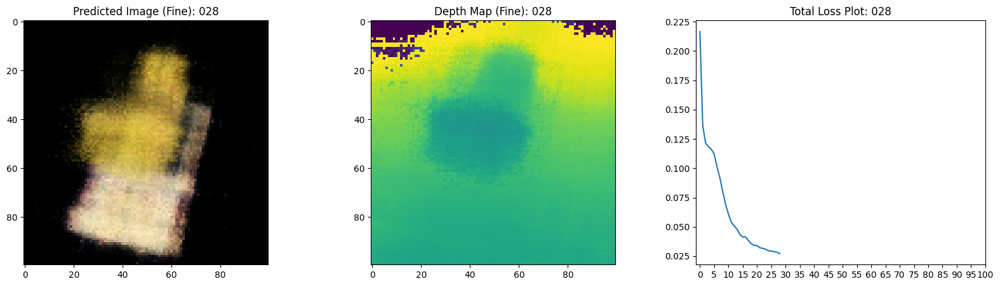

16/16 [==============================] - 6s 394ms/step - loss: 0.0272 - coarse_loss: 0.0143 - fine_loss: 0.0129 - coarse_psnr: 18.5534 - psnr: 19.0214 - val_loss: 0.0263 - val_coarse_loss: 0.0136 - val_fine_loss: 0.0126 - val_coarse_psnr: 18.7443 - val_psnr: 19.0578
Epoch 30/100
16/16 [==============================] - ETA: 0s - loss: 0.0268 - coarse_loss: 0.0141 - fine_loss: 0.0129 - coarse_psnr: 18.6272 - psnr: 19.0827

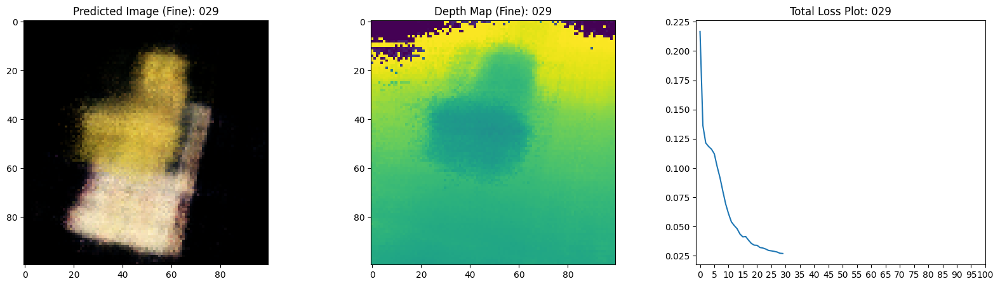

16/16 [==============================] - 6s 406ms/step - loss: 0.0269 - coarse_loss: 0.0141 - fine_loss: 0.0129 - coarse_psnr: 18.6272 - psnr: 19.0806 - val_loss: 0.0265 - val_coarse_loss: 0.0137 - val_fine_loss: 0.0127 - val_coarse_psnr: 18.7286 - val_psnr: 19.0424
Epoch 31/100
16/16 [==============================] - ETA: 0s - loss: 0.0264 - coarse_loss: 0.0140 - fine_loss: 0.0128 - coarse_psnr: 18.6558 - psnr: 19.1083

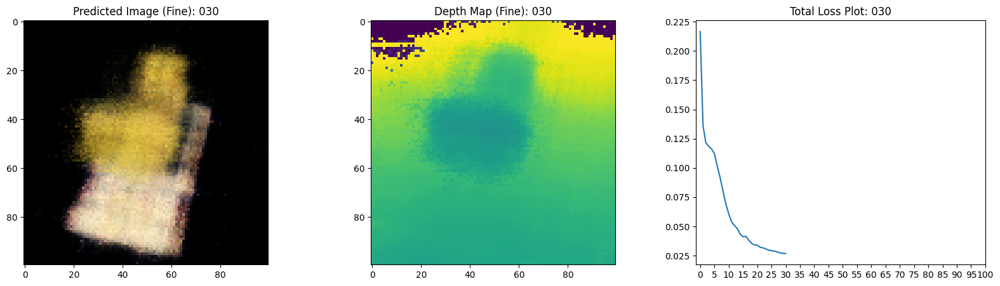

16/16 [==============================] - 6s 392ms/step - loss: 0.0264 - coarse_loss: 0.0140 - fine_loss: 0.0128 - coarse_psnr: 18.6558 - psnr: 19.1063 - val_loss: 0.0260 - val_coarse_loss: 0.0135 - val_fine_loss: 0.0125 - val_coarse_psnr: 18.7995 - val_psnr: 19.0940
Epoch 32/100
16/16 [==============================] - ETA: 0s - loss: 0.0258 - coarse_loss: 0.0136 - fine_loss: 0.0124 - coarse_psnr: 18.7904 - psnr: 19.2111

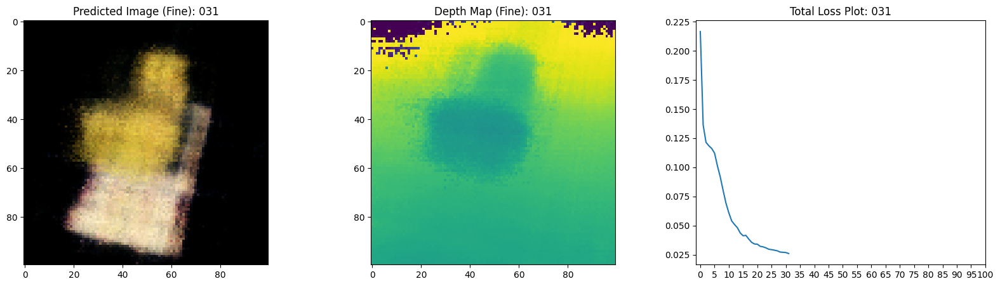

16/16 [==============================] - 6s 391ms/step - loss: 0.0258 - coarse_loss: 0.0136 - fine_loss: 0.0124 - coarse_psnr: 18.7904 - psnr: 19.2113 - val_loss: 0.0255 - val_coarse_loss: 0.0132 - val_fine_loss: 0.0124 - val_coarse_psnr: 18.9001 - val_psnr: 19.1447
Epoch 33/100
16/16 [==============================] - ETA: 0s - loss: 0.0253 - coarse_loss: 0.0132 - fine_loss: 0.0120 - coarse_psnr: 18.9146 - psnr: 19.3030

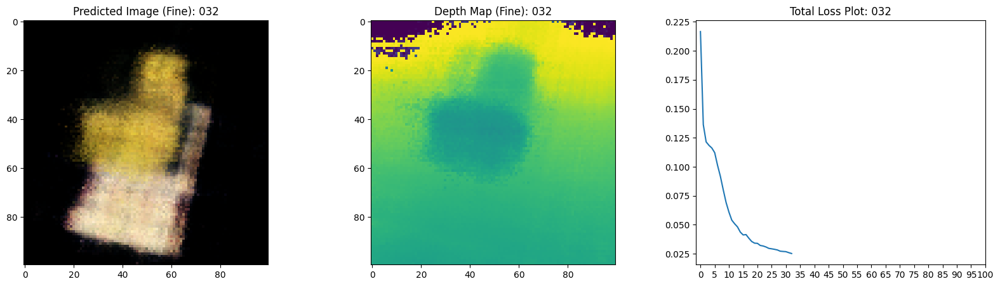

16/16 [==============================] - 6s 393ms/step - loss: 0.0253 - coarse_loss: 0.0132 - fine_loss: 0.0120 - coarse_psnr: 18.9146 - psnr: 19.3063 - val_loss: 0.0258 - val_coarse_loss: 0.0135 - val_fine_loss: 0.0123 - val_coarse_psnr: 18.8574 - val_psnr: 19.1901
Epoch 34/100
16/16 [==============================] - ETA: 0s - loss: 0.0245 - coarse_loss: 0.0131 - fine_loss: 0.0120 - coarse_psnr: 18.9666 - psnr: 19.4764

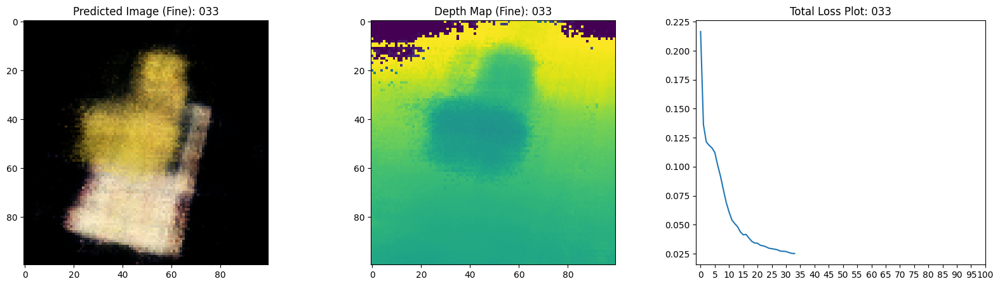

16/16 [==============================] - 6s 395ms/step - loss: 0.0246 - coarse_loss: 0.0131 - fine_loss: 0.0120 - coarse_psnr: 18.9666 - psnr: 19.4707 - val_loss: 0.0247 - val_coarse_loss: 0.0127 - val_fine_loss: 0.0119 - val_coarse_psnr: 19.0596 - val_psnr: 19.3309
Epoch 35/100
16/16 [==============================] - ETA: 0s - loss: 0.0246 - coarse_loss: 0.0129 - fine_loss: 0.0119 - coarse_psnr: 19.0186 - psnr: 19.3855

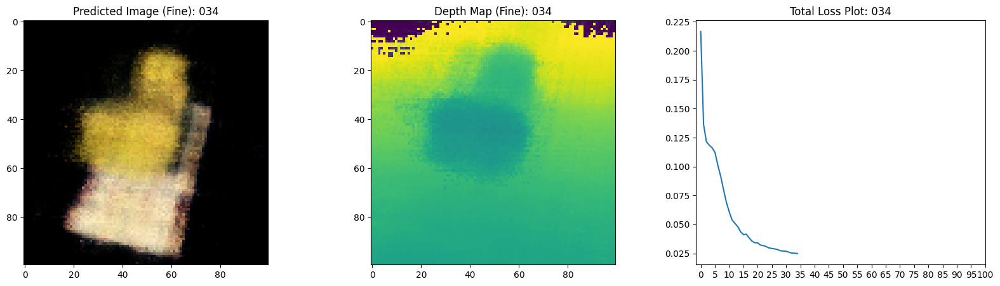

16/16 [==============================] - 6s 393ms/step - loss: 0.0246 - coarse_loss: 0.0129 - fine_loss: 0.0119 - coarse_psnr: 19.0186 - psnr: 19.3846 - val_loss: 0.0245 - val_coarse_loss: 0.0127 - val_fine_loss: 0.0118 - val_coarse_psnr: 19.0354 - val_psnr: 19.3508
Epoch 36/100
16/16 [==============================] - ETA: 0s - loss: 0.0244 - coarse_loss: 0.0128 - fine_loss: 0.0118 - coarse_psnr: 19.0620 - psnr: 19.4141

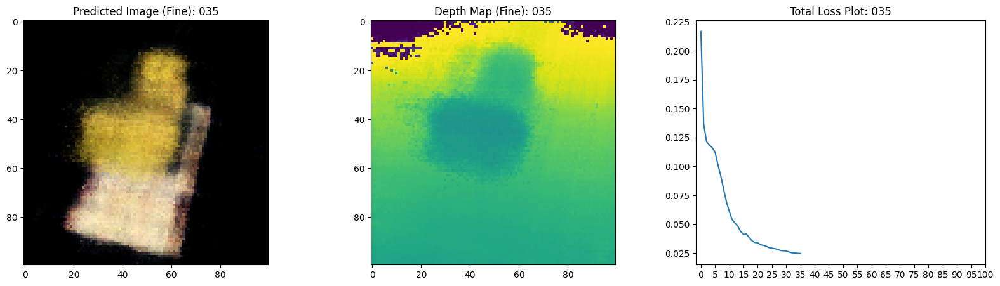

16/16 [==============================] - 6s 396ms/step - loss: 0.0244 - coarse_loss: 0.0128 - fine_loss: 0.0118 - coarse_psnr: 19.0620 - psnr: 19.4145 - val_loss: 0.0242 - val_coarse_loss: 0.0126 - val_fine_loss: 0.0115 - val_coarse_psnr: 19.1282 - val_psnr: 19.4669
Epoch 37/100
16/16 [==============================] - ETA: 0s - loss: 0.0243 - coarse_loss: 0.0127 - fine_loss: 0.0115 - coarse_psnr: 19.1036 - psnr: 19.5222

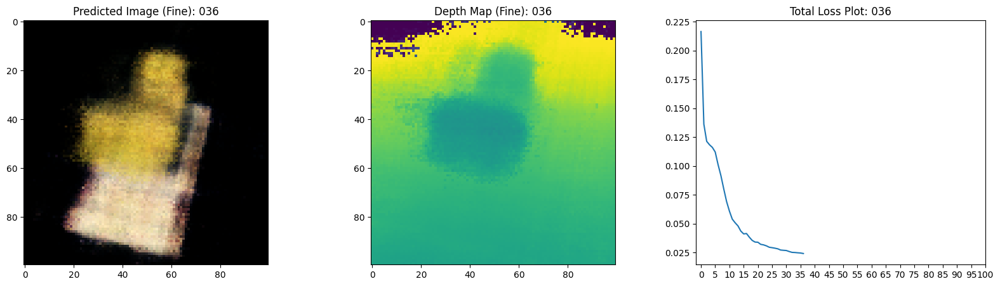

16/16 [==============================] - 6s 392ms/step - loss: 0.0243 - coarse_loss: 0.0127 - fine_loss: 0.0115 - coarse_psnr: 19.1036 - psnr: 19.5231 - val_loss: 0.0241 - val_coarse_loss: 0.0125 - val_fine_loss: 0.0116 - val_coarse_psnr: 19.1500 - val_psnr: 19.4643
Epoch 38/100
16/16 [==============================] - ETA: 0s - loss: 0.0235 - coarse_loss: 0.0122 - fine_loss: 0.0111 - coarse_psnr: 19.2851 - psnr: 19.6389

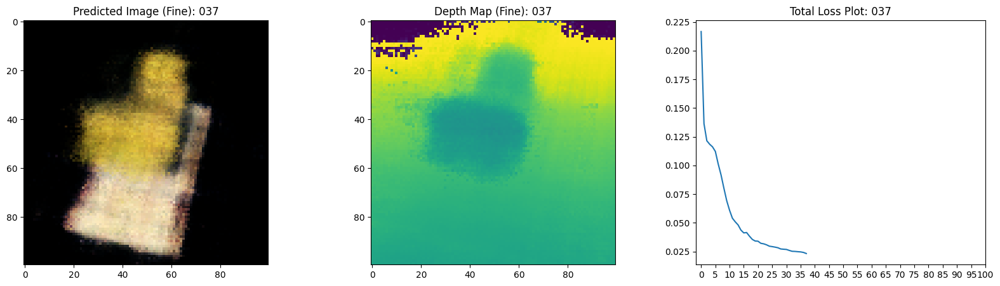

16/16 [==============================] - 6s 393ms/step - loss: 0.0235 - coarse_loss: 0.0122 - fine_loss: 0.0111 - coarse_psnr: 19.2851 - psnr: 19.6428 - val_loss: 0.0234 - val_coarse_loss: 0.0121 - val_fine_loss: 0.0113 - val_coarse_psnr: 19.2759 - val_psnr: 19.5957
Epoch 39/100
16/16 [==============================] - ETA: 0s - loss: 0.0236 - coarse_loss: 0.0122 - fine_loss: 0.0111 - coarse_psnr: 19.2648 - psnr: 19.6111

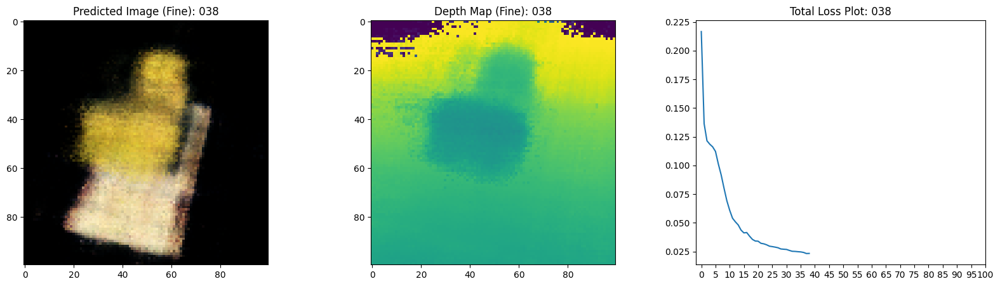

16/16 [==============================] - 6s 394ms/step - loss: 0.0236 - coarse_loss: 0.0122 - fine_loss: 0.0111 - coarse_psnr: 19.2648 - psnr: 19.6162 - val_loss: 0.0232 - val_coarse_loss: 0.0119 - val_fine_loss: 0.0112 - val_coarse_psnr: 19.3447 - val_psnr: 19.5688
Epoch 40/100
16/16 [==============================] - ETA: 0s - loss: 0.0231 - coarse_loss: 0.0120 - fine_loss: 0.0110 - coarse_psnr: 19.3611 - psnr: 19.6804

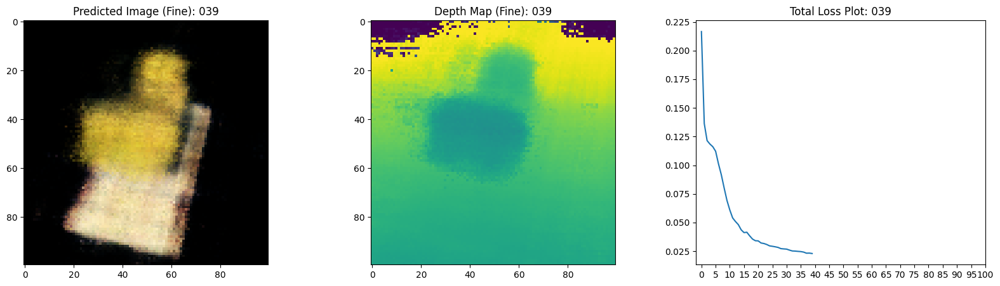

16/16 [==============================] - 6s 402ms/step - loss: 0.0231 - coarse_loss: 0.0120 - fine_loss: 0.0110 - coarse_psnr: 19.3611 - psnr: 19.6841 - val_loss: 0.0227 - val_coarse_loss: 0.0117 - val_fine_loss: 0.0109 - val_coarse_psnr: 19.4029 - val_psnr: 19.7109
Epoch 41/100
16/16 [==============================] - ETA: 0s - loss: 0.0226 - coarse_loss: 0.0118 - fine_loss: 0.0109 - coarse_psnr: 19.4093 - psnr: 19.7433

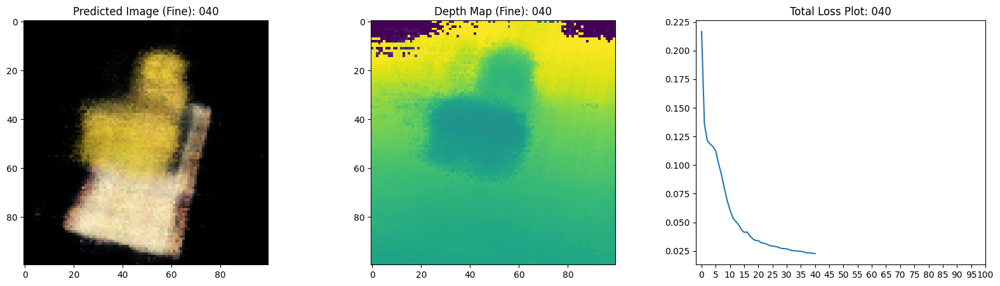

16/16 [==============================] - 6s 395ms/step - loss: 0.0226 - coarse_loss: 0.0118 - fine_loss: 0.0109 - coarse_psnr: 19.4093 - psnr: 19.7444 - val_loss: 0.0224 - val_coarse_loss: 0.0115 - val_fine_loss: 0.0109 - val_coarse_psnr: 19.4760 - val_psnr: 19.7190
Epoch 42/100
16/16 [==============================] - ETA: 0s - loss: 0.0224 - coarse_loss: 0.0117 - fine_loss: 0.0107 - coarse_psnr: 19.4724 - psnr: 19.7994

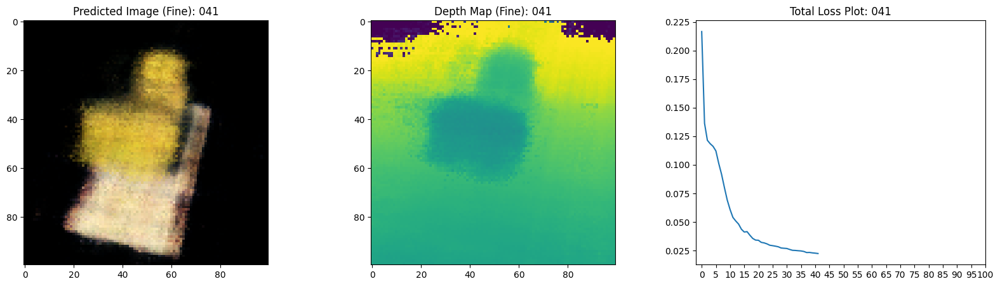

16/16 [==============================] - 6s 392ms/step - loss: 0.0224 - coarse_loss: 0.0117 - fine_loss: 0.0107 - coarse_psnr: 19.4724 - psnr: 19.8018 - val_loss: 0.0226 - val_coarse_loss: 0.0118 - val_fine_loss: 0.0108 - val_coarse_psnr: 19.3676 - val_psnr: 19.7417
Epoch 43/100
16/16 [==============================] - ETA: 0s - loss: 0.0219 - coarse_loss: 0.0116 - fine_loss: 0.0105 - coarse_psnr: 19.5146 - psnr: 19.9332

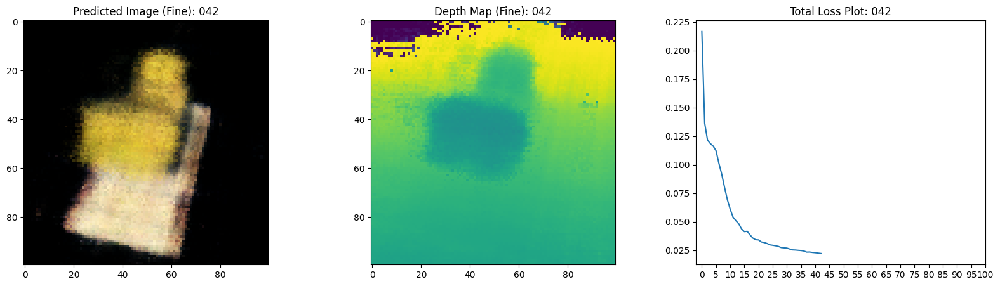

16/16 [==============================] - 6s 393ms/step - loss: 0.0219 - coarse_loss: 0.0116 - fine_loss: 0.0105 - coarse_psnr: 19.5146 - psnr: 19.9332 - val_loss: 0.0208 - val_coarse_loss: 0.0107 - val_fine_loss: 0.0101 - val_coarse_psnr: 19.7598 - val_psnr: 20.0622
Epoch 44/100
16/16 [==============================] - ETA: 0s - loss: 0.0218 - coarse_loss: 0.0114 - fine_loss: 0.0105 - coarse_psnr: 19.5385 - psnr: 19.9535

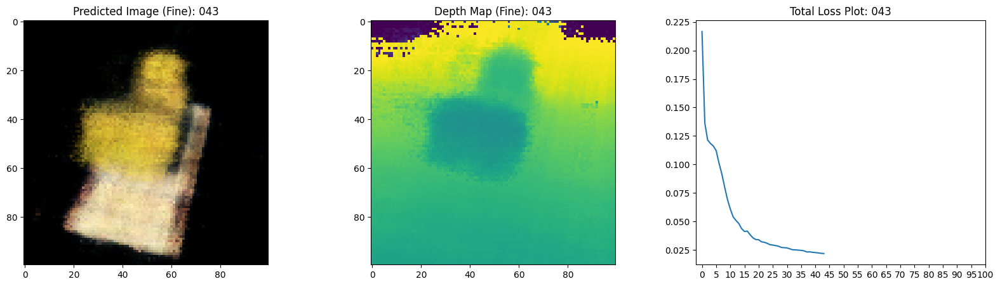

16/16 [==============================] - 6s 395ms/step - loss: 0.0218 - coarse_loss: 0.0114 - fine_loss: 0.0105 - coarse_psnr: 19.5385 - psnr: 19.9531 - val_loss: 0.0221 - val_coarse_loss: 0.0115 - val_fine_loss: 0.0106 - val_coarse_psnr: 19.4868 - val_psnr: 19.8315
Epoch 45/100
16/16 [==============================] - ETA: 0s - loss: 0.0212 - coarse_loss: 0.0113 - fine_loss: 0.0103 - coarse_psnr: 19.6107 - psnr: 20.0684

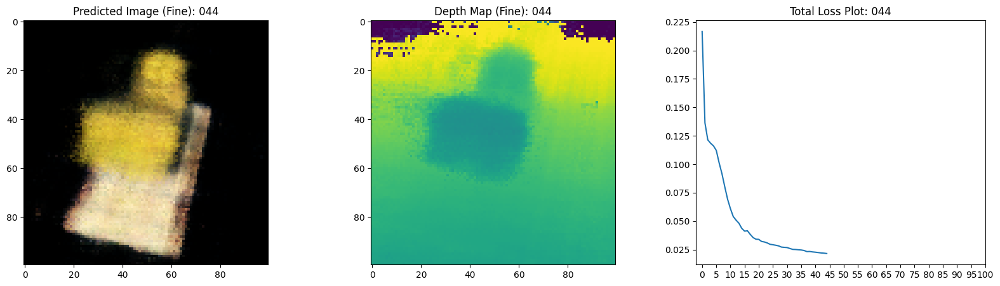

16/16 [==============================] - 6s 392ms/step - loss: 0.0213 - coarse_loss: 0.0113 - fine_loss: 0.0103 - coarse_psnr: 19.6107 - psnr: 20.0657 - val_loss: 0.0211 - val_coarse_loss: 0.0108 - val_fine_loss: 0.0102 - val_coarse_psnr: 19.7502 - val_psnr: 19.9728
Epoch 46/100
16/16 [==============================] - ETA: 0s - loss: 0.0213 - coarse_loss: 0.0112 - fine_loss: 0.0103 - coarse_psnr: 19.6333 - psnr: 20.0238

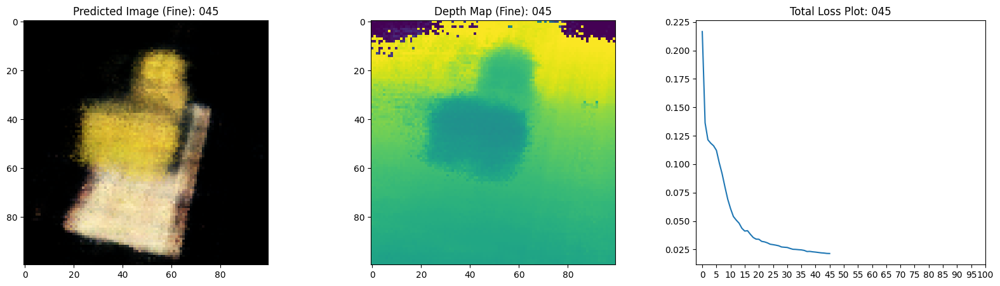

16/16 [==============================] - 6s 393ms/step - loss: 0.0214 - coarse_loss: 0.0112 - fine_loss: 0.0103 - coarse_psnr: 19.6333 - psnr: 20.0243 - val_loss: 0.0213 - val_coarse_loss: 0.0111 - val_fine_loss: 0.0102 - val_coarse_psnr: 19.6413 - val_psnr: 20.0054
Epoch 47/100
16/16 [==============================] - ETA: 0s - loss: 0.0216 - coarse_loss: 0.0111 - fine_loss: 0.0103 - coarse_psnr: 19.6730 - psnr: 19.9815

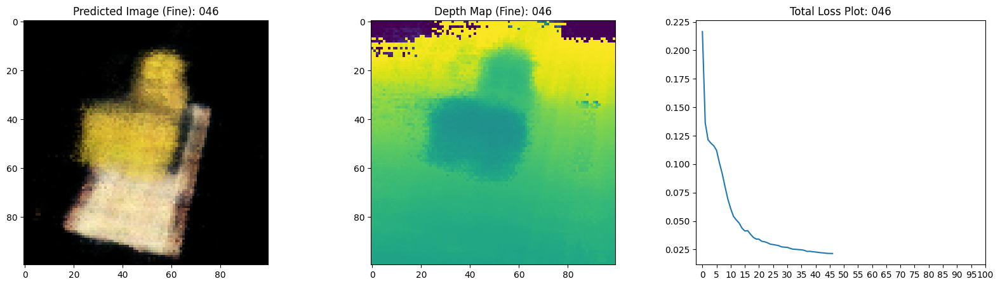

16/16 [==============================] - 6s 393ms/step - loss: 0.0216 - coarse_loss: 0.0111 - fine_loss: 0.0103 - coarse_psnr: 19.6730 - psnr: 19.9849 - val_loss: 0.0206 - val_coarse_loss: 0.0107 - val_fine_loss: 0.0099 - val_coarse_psnr: 19.8018 - val_psnr: 20.1123
Epoch 48/100
16/16 [==============================] - ETA: 0s - loss: 0.0208 - coarse_loss: 0.0108 - fine_loss: 0.0099 - coarse_psnr: 19.8192 - psnr: 20.1545

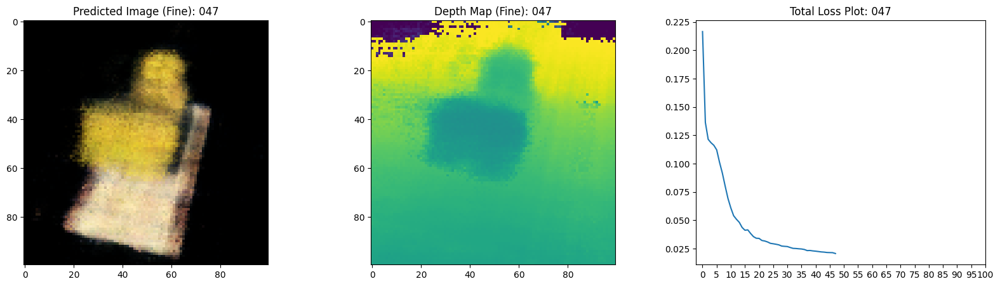

16/16 [==============================] - 6s 393ms/step - loss: 0.0208 - coarse_loss: 0.0108 - fine_loss: 0.0099 - coarse_psnr: 19.8192 - psnr: 20.1582 - val_loss: 0.0207 - val_coarse_loss: 0.0107 - val_fine_loss: 0.0099 - val_coarse_psnr: 19.8287 - val_psnr: 20.1512
Epoch 49/100
16/16 [==============================] - ETA: 0s - loss: 0.0205 - coarse_loss: 0.0108 - fine_loss: 0.0098 - coarse_psnr: 19.8234 - psnr: 20.2549

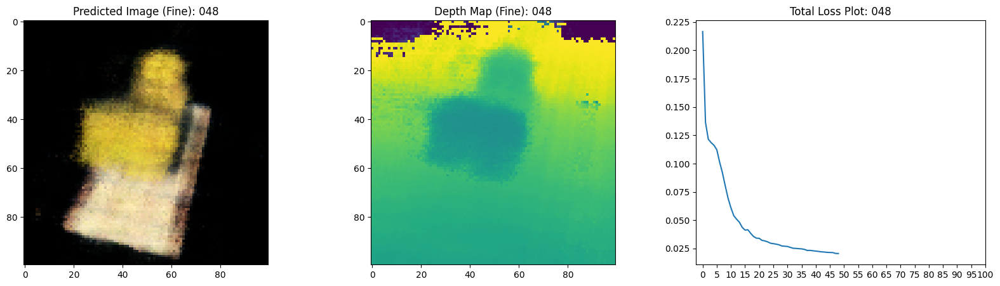

16/16 [==============================] - 6s 401ms/step - loss: 0.0205 - coarse_loss: 0.0108 - fine_loss: 0.0098 - coarse_psnr: 19.8234 - psnr: 20.2553 - val_loss: 0.0205 - val_coarse_loss: 0.0106 - val_fine_loss: 0.0099 - val_coarse_psnr: 19.8209 - val_psnr: 20.1246
Epoch 50/100
16/16 [==============================] - ETA: 0s - loss: 0.0206 - coarse_loss: 0.0108 - fine_loss: 0.0097 - coarse_psnr: 19.8203 - psnr: 20.2302

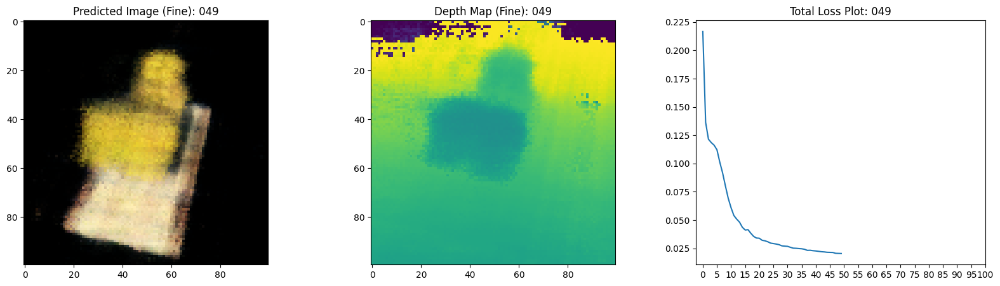

16/16 [==============================] - 6s 394ms/step - loss: 0.0206 - coarse_loss: 0.0108 - fine_loss: 0.0097 - coarse_psnr: 19.8203 - psnr: 20.2328 - val_loss: 0.0194 - val_coarse_loss: 0.0101 - val_fine_loss: 0.0093 - val_coarse_psnr: 20.0877 - val_psnr: 20.4323
Epoch 51/100
16/16 [==============================] - ETA: 0s - loss: 0.0199 - coarse_loss: 0.0105 - fine_loss: 0.0096 - coarse_psnr: 19.9211 - psnr: 20.3549

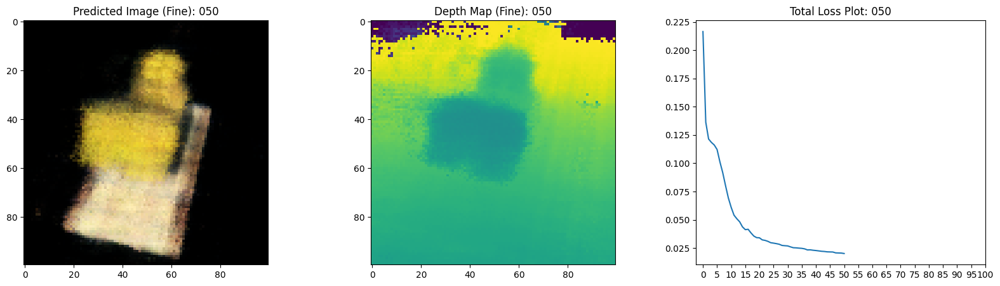

16/16 [==============================] - 6s 392ms/step - loss: 0.0199 - coarse_loss: 0.0105 - fine_loss: 0.0096 - coarse_psnr: 19.9211 - psnr: 20.3550 - val_loss: 0.0194 - val_coarse_loss: 0.0100 - val_fine_loss: 0.0095 - val_coarse_psnr: 20.1241 - val_psnr: 20.3216
Epoch 52/100
16/16 [==============================] - ETA: 0s - loss: 0.0202 - coarse_loss: 0.0105 - fine_loss: 0.0095 - coarse_psnr: 19.9185 - psnr: 20.2802

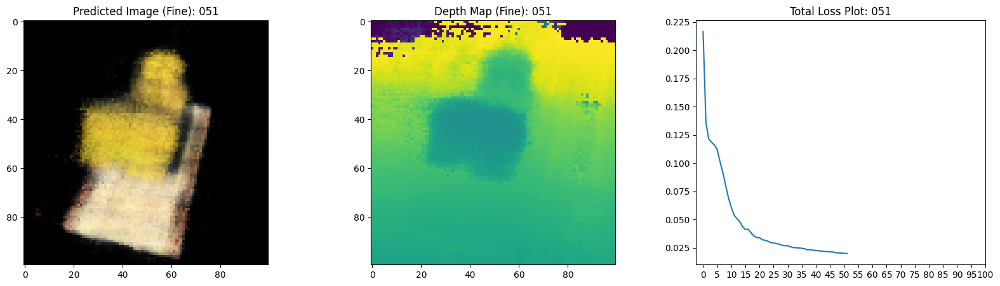

16/16 [==============================] - 6s 391ms/step - loss: 0.0202 - coarse_loss: 0.0105 - fine_loss: 0.0095 - coarse_psnr: 19.9185 - psnr: 20.2862 - val_loss: 0.0196 - val_coarse_loss: 0.0101 - val_fine_loss: 0.0095 - val_coarse_psnr: 20.0301 - val_psnr: 20.3395
Epoch 53/100
16/16 [==============================] - ETA: 0s - loss: 0.0196 - coarse_loss: 0.0103 - fine_loss: 0.0093 - coarse_psnr: 20.0045 - psnr: 20.4651

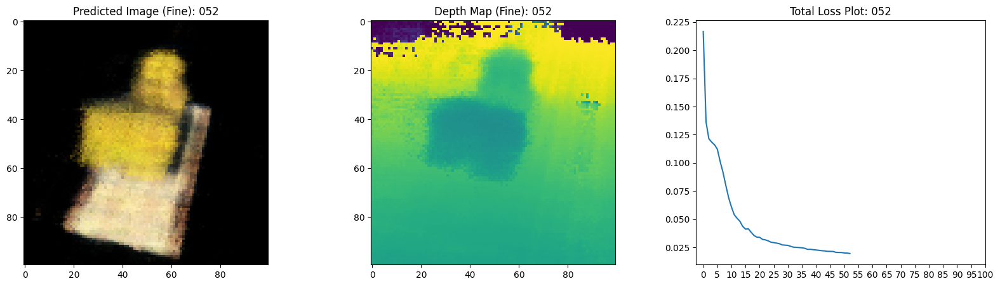

16/16 [==============================] - 6s 390ms/step - loss: 0.0196 - coarse_loss: 0.0103 - fine_loss: 0.0093 - coarse_psnr: 20.0045 - psnr: 20.4660 - val_loss: 0.0194 - val_coarse_loss: 0.0101 - val_fine_loss: 0.0093 - val_coarse_psnr: 20.0940 - val_psnr: 20.4630
Epoch 54/100
16/16 [==============================] - ETA: 0s - loss: 0.0194 - coarse_loss: 0.0103 - fine_loss: 0.0093 - coarse_psnr: 20.0283 - psnr: 20.4887

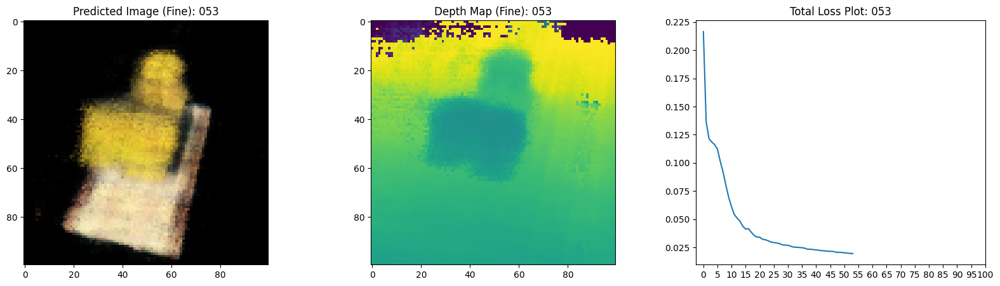

16/16 [==============================] - 6s 393ms/step - loss: 0.0194 - coarse_loss: 0.0103 - fine_loss: 0.0093 - coarse_psnr: 20.0283 - psnr: 20.4889 - val_loss: 0.0190 - val_coarse_loss: 0.0098 - val_fine_loss: 0.0092 - val_coarse_psnr: 20.1949 - val_psnr: 20.5277
Epoch 55/100
16/16 [==============================] - ETA: 0s - loss: 0.0195 - coarse_loss: 0.0103 - fine_loss: 0.0092 - coarse_psnr: 20.0251 - psnr: 20.4771

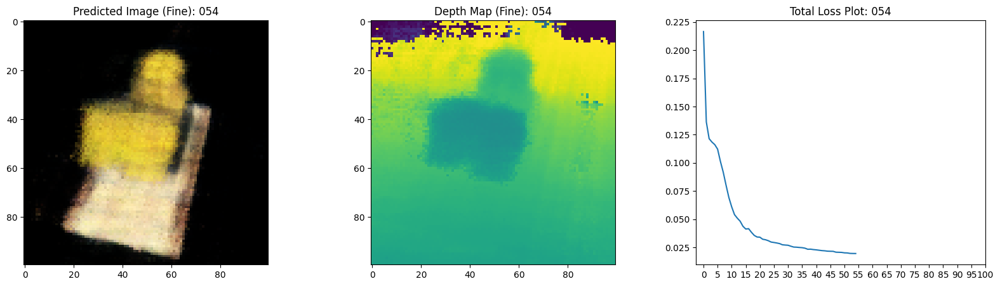

16/16 [==============================] - 6s 394ms/step - loss: 0.0195 - coarse_loss: 0.0103 - fine_loss: 0.0092 - coarse_psnr: 20.0251 - psnr: 20.4782 - val_loss: 0.0192 - val_coarse_loss: 0.0099 - val_fine_loss: 0.0093 - val_coarse_psnr: 20.1023 - val_psnr: 20.4146
Epoch 56/100
16/16 [==============================] - ETA: 0s - loss: 0.0192 - coarse_loss: 0.0102 - fine_loss: 0.0092 - coarse_psnr: 20.0295 - psnr: 20.5094

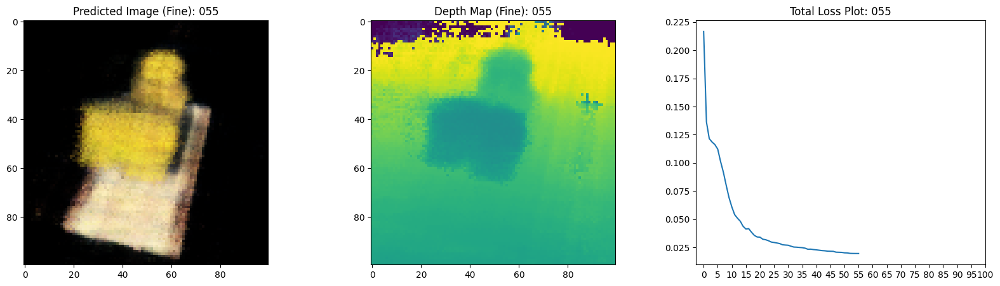

16/16 [==============================] - 6s 395ms/step - loss: 0.0192 - coarse_loss: 0.0102 - fine_loss: 0.0092 - coarse_psnr: 20.0295 - psnr: 20.5079 - val_loss: 0.0189 - val_coarse_loss: 0.0097 - val_fine_loss: 0.0092 - val_coarse_psnr: 20.2166 - val_psnr: 20.4865
Epoch 57/100
16/16 [==============================] - ETA: 0s - loss: 0.0190 - coarse_loss: 0.0101 - fine_loss: 0.0091 - coarse_psnr: 20.1185 - psnr: 20.5328

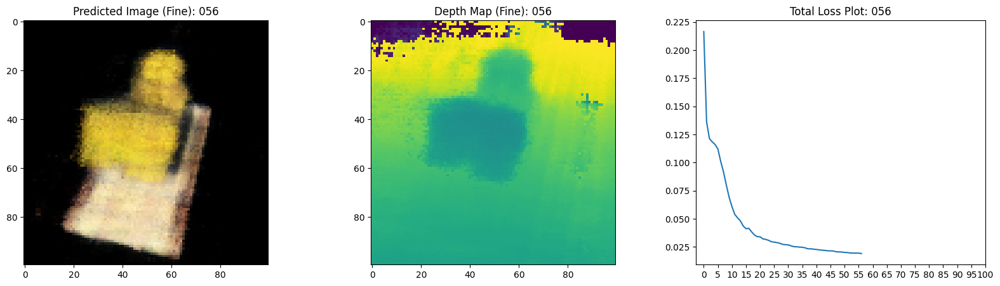

16/16 [==============================] - 6s 392ms/step - loss: 0.0190 - coarse_loss: 0.0101 - fine_loss: 0.0091 - coarse_psnr: 20.1185 - psnr: 20.5347 - val_loss: 0.0184 - val_coarse_loss: 0.0096 - val_fine_loss: 0.0088 - val_coarse_psnr: 20.3092 - val_psnr: 20.6536
Epoch 58/100
16/16 [==============================] - ETA: 0s - loss: 0.0189 - coarse_loss: 0.0099 - fine_loss: 0.0089 - coarse_psnr: 20.1812 - psnr: 20.5951

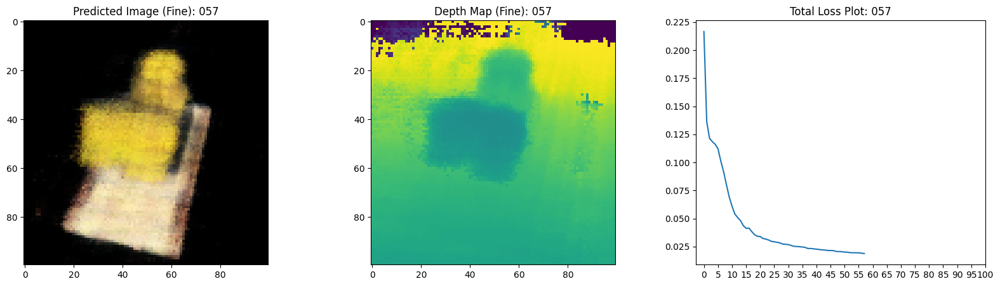

16/16 [==============================] - 6s 403ms/step - loss: 0.0189 - coarse_loss: 0.0099 - fine_loss: 0.0089 - coarse_psnr: 20.1812 - psnr: 20.5984 - val_loss: 0.0186 - val_coarse_loss: 0.0096 - val_fine_loss: 0.0090 - val_coarse_psnr: 20.2464 - val_psnr: 20.5709
Epoch 59/100
16/16 [==============================] - ETA: 0s - loss: 0.0191 - coarse_loss: 0.0101 - fine_loss: 0.0090 - coarse_psnr: 20.1143 - psnr: 20.5671

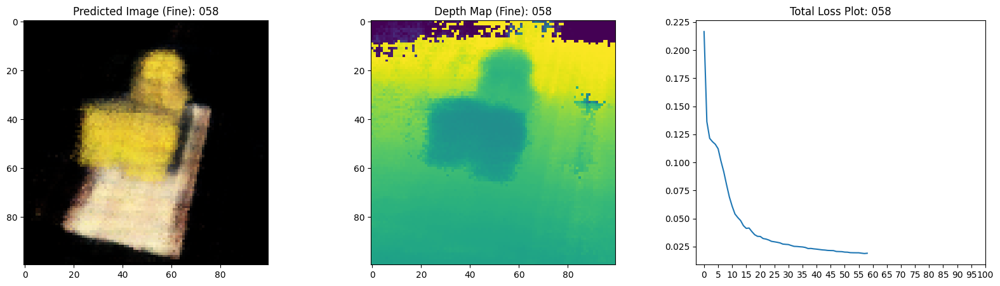

16/16 [==============================] - 6s 391ms/step - loss: 0.0191 - coarse_loss: 0.0101 - fine_loss: 0.0090 - coarse_psnr: 20.1143 - psnr: 20.5695 - val_loss: 0.0186 - val_coarse_loss: 0.0096 - val_fine_loss: 0.0089 - val_coarse_psnr: 20.2482 - val_psnr: 20.5593
Epoch 60/100
16/16 [==============================] - ETA: 0s - loss: 0.0190 - coarse_loss: 0.0098 - fine_loss: 0.0087 - coarse_psnr: 20.2541 - psnr: 20.5712

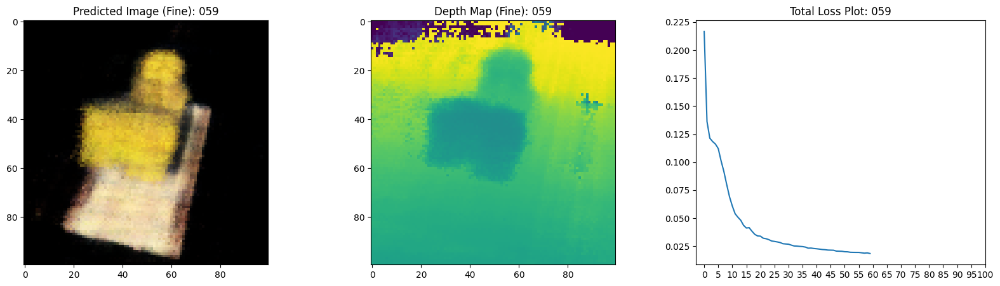

16/16 [==============================] - 6s 393ms/step - loss: 0.0189 - coarse_loss: 0.0098 - fine_loss: 0.0087 - coarse_psnr: 20.2541 - psnr: 20.5810 - val_loss: 0.0187 - val_coarse_loss: 0.0098 - val_fine_loss: 0.0088 - val_coarse_psnr: 20.1890 - val_psnr: 20.6257
Epoch 61/100
16/16 [==============================] - ETA: 0s - loss: 0.0185 - coarse_loss: 0.0097 - fine_loss: 0.0087 - coarse_psnr: 20.2724 - psnr: 20.7102

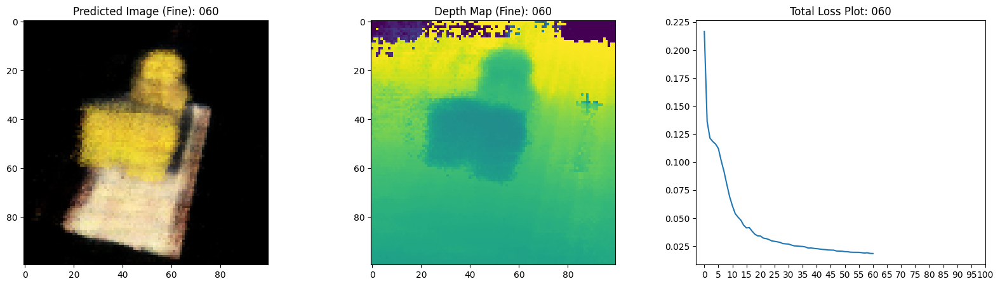

16/16 [==============================] - 6s 394ms/step - loss: 0.0185 - coarse_loss: 0.0097 - fine_loss: 0.0087 - coarse_psnr: 20.2724 - psnr: 20.7127 - val_loss: 0.0181 - val_coarse_loss: 0.0094 - val_fine_loss: 0.0087 - val_coarse_psnr: 20.3412 - val_psnr: 20.7160
Epoch 62/100
16/16 [==============================] - ETA: 0s - loss: 0.0185 - coarse_loss: 0.0096 - fine_loss: 0.0086 - coarse_psnr: 20.2922 - psnr: 20.7197

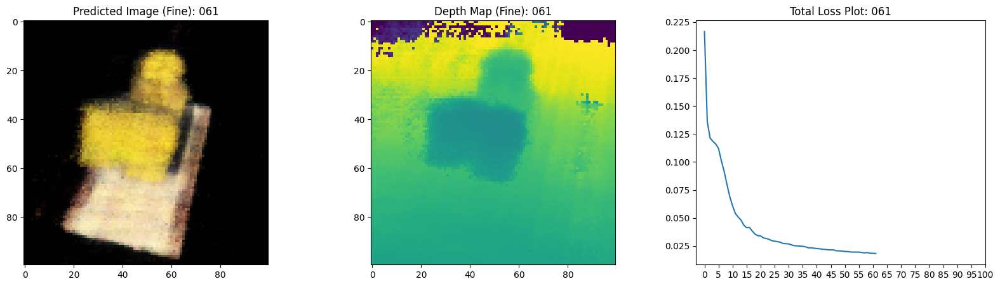

16/16 [==============================] - 6s 392ms/step - loss: 0.0185 - coarse_loss: 0.0096 - fine_loss: 0.0086 - coarse_psnr: 20.2922 - psnr: 20.7253 - val_loss: 0.0180 - val_coarse_loss: 0.0093 - val_fine_loss: 0.0086 - val_coarse_psnr: 20.3904 - val_psnr: 20.7355
Epoch 63/100
16/16 [==============================] - ETA: 0s - loss: 0.0185 - coarse_loss: 0.0097 - fine_loss: 0.0087 - coarse_psnr: 20.2366 - psnr: 20.7010

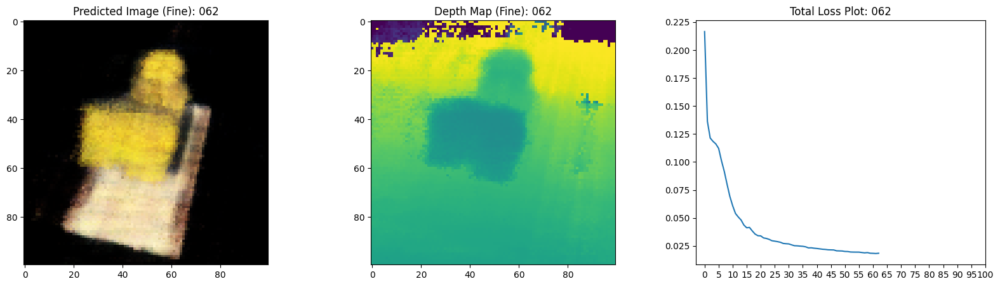

16/16 [==============================] - 6s 392ms/step - loss: 0.0185 - coarse_loss: 0.0097 - fine_loss: 0.0087 - coarse_psnr: 20.2366 - psnr: 20.7027 - val_loss: 0.0176 - val_coarse_loss: 0.0091 - val_fine_loss: 0.0085 - val_coarse_psnr: 20.4767 - val_psnr: 20.7960
Epoch 64/100
16/16 [==============================] - ETA: 0s - loss: 0.0182 - coarse_loss: 0.0096 - fine_loss: 0.0086 - coarse_psnr: 20.3066 - psnr: 20.7688

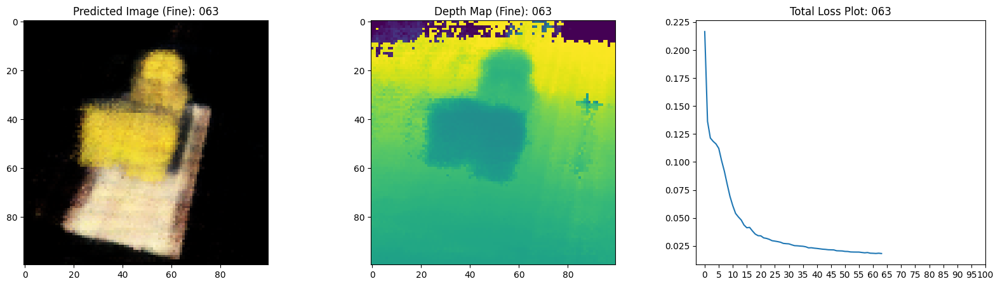

16/16 [==============================] - 6s 391ms/step - loss: 0.0182 - coarse_loss: 0.0096 - fine_loss: 0.0086 - coarse_psnr: 20.3066 - psnr: 20.7716 - val_loss: 0.0179 - val_coarse_loss: 0.0092 - val_fine_loss: 0.0087 - val_coarse_psnr: 20.4336 - val_psnr: 20.6871
Epoch 65/100
16/16 [==============================] - ETA: 0s - loss: 0.0182 - coarse_loss: 0.0095 - fine_loss: 0.0086 - coarse_psnr: 20.3418 - psnr: 20.7440

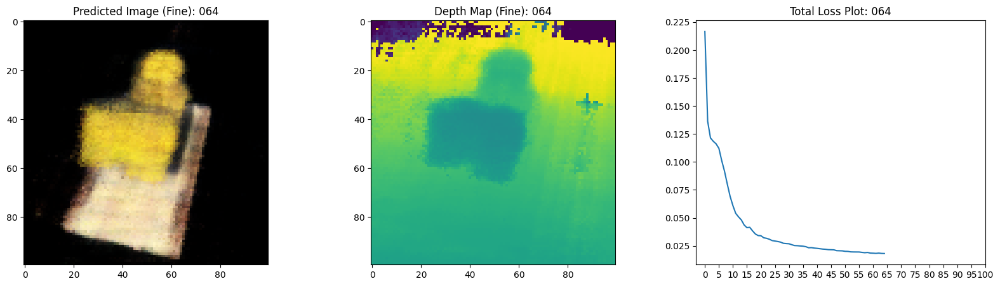

16/16 [==============================] - 6s 393ms/step - loss: 0.0182 - coarse_loss: 0.0095 - fine_loss: 0.0086 - coarse_psnr: 20.3418 - psnr: 20.7481 - val_loss: 0.0172 - val_coarse_loss: 0.0089 - val_fine_loss: 0.0083 - val_coarse_psnr: 20.6329 - val_psnr: 20.9269
Epoch 66/100
16/16 [==============================] - ETA: 0s - loss: 0.0178 - coarse_loss: 0.0094 - fine_loss: 0.0084 - coarse_psnr: 20.4194 - psnr: 20.8848

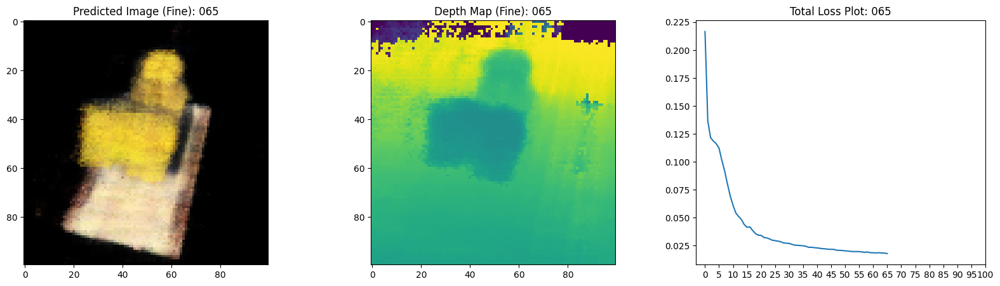

16/16 [==============================] - 6s 394ms/step - loss: 0.0178 - coarse_loss: 0.0094 - fine_loss: 0.0084 - coarse_psnr: 20.4194 - psnr: 20.8878 - val_loss: 0.0172 - val_coarse_loss: 0.0090 - val_fine_loss: 0.0081 - val_coarse_psnr: 20.5813 - val_psnr: 21.0348
Epoch 67/100
16/16 [==============================] - ETA: 0s - loss: 0.0177 - coarse_loss: 0.0094 - fine_loss: 0.0084 - coarse_psnr: 20.4091 - psnr: 20.9021

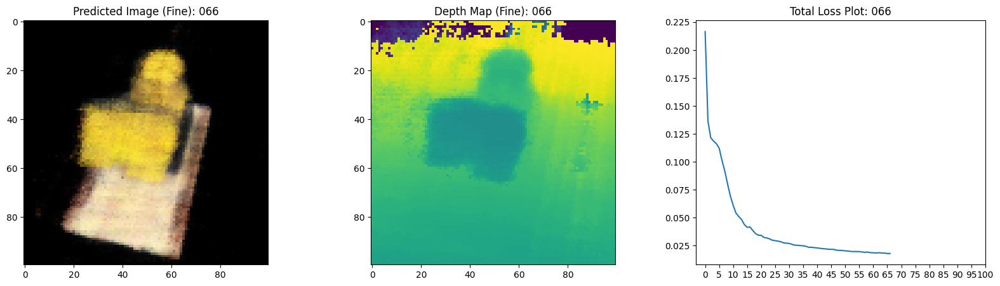

16/16 [==============================] - 6s 390ms/step - loss: 0.0177 - coarse_loss: 0.0094 - fine_loss: 0.0084 - coarse_psnr: 20.4091 - psnr: 20.9026 - val_loss: 0.0166 - val_coarse_loss: 0.0087 - val_fine_loss: 0.0080 - val_coarse_psnr: 20.7217 - val_psnr: 21.1042
Epoch 68/100
16/16 [==============================] - ETA: 0s - loss: 0.0176 - coarse_loss: 0.0093 - fine_loss: 0.0083 - coarse_psnr: 20.4396 - psnr: 20.9265

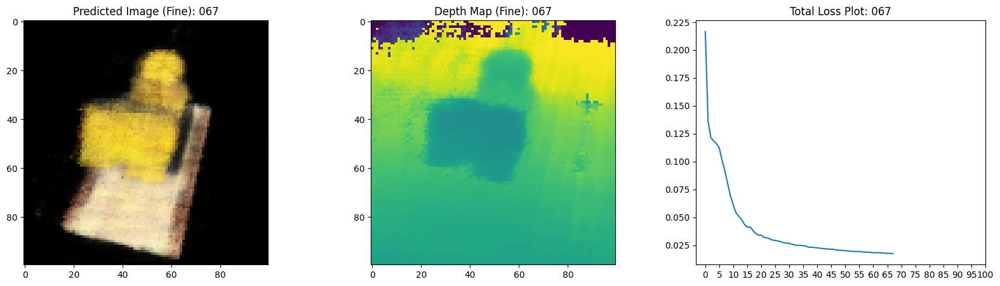

16/16 [==============================] - 6s 407ms/step - loss: 0.0176 - coarse_loss: 0.0093 - fine_loss: 0.0083 - coarse_psnr: 20.4396 - psnr: 20.9272 - val_loss: 0.0165 - val_coarse_loss: 0.0086 - val_fine_loss: 0.0079 - val_coarse_psnr: 20.7487 - val_psnr: 21.1200
Epoch 69/100
16/16 [==============================] - ETA: 0s - loss: 0.0173 - coarse_loss: 0.0092 - fine_loss: 0.0082 - coarse_psnr: 20.4817 - psnr: 20.9901

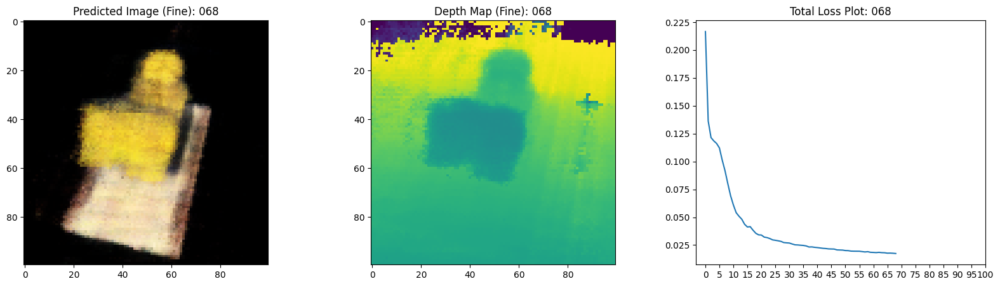

16/16 [==============================] - 6s 391ms/step - loss: 0.0173 - coarse_loss: 0.0092 - fine_loss: 0.0082 - coarse_psnr: 20.4817 - psnr: 20.9916 - val_loss: 0.0170 - val_coarse_loss: 0.0089 - val_fine_loss: 0.0082 - val_coarse_psnr: 20.5937 - val_psnr: 20.9709
Epoch 70/100
16/16 [==============================] - ETA: 0s - loss: 0.0174 - coarse_loss: 0.0092 - fine_loss: 0.0081 - coarse_psnr: 20.5029 - psnr: 20.9910

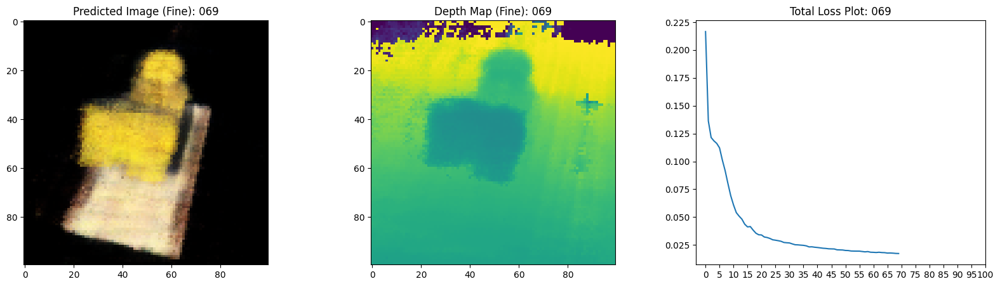

16/16 [==============================] - 6s 393ms/step - loss: 0.0174 - coarse_loss: 0.0092 - fine_loss: 0.0081 - coarse_psnr: 20.5029 - psnr: 20.9950 - val_loss: 0.0163 - val_coarse_loss: 0.0085 - val_fine_loss: 0.0078 - val_coarse_psnr: 20.7979 - val_psnr: 21.2272
Epoch 71/100
16/16 [==============================] - ETA: 0s - loss: 0.0173 - coarse_loss: 0.0091 - fine_loss: 0.0080 - coarse_psnr: 20.5520 - psnr: 21.0277

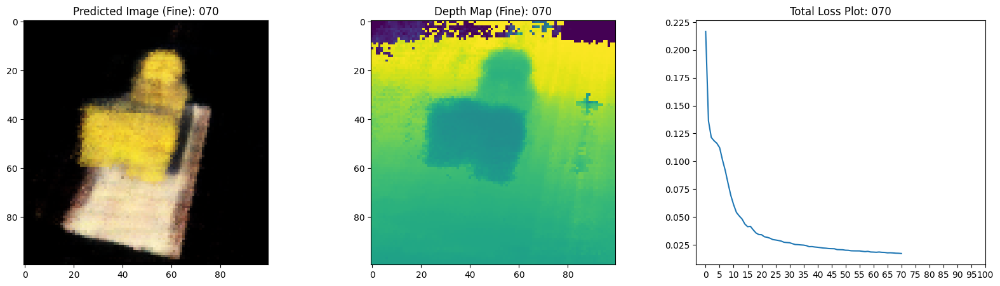

16/16 [==============================] - 6s 396ms/step - loss: 0.0173 - coarse_loss: 0.0091 - fine_loss: 0.0080 - coarse_psnr: 20.5520 - psnr: 21.0329 - val_loss: 0.0164 - val_coarse_loss: 0.0086 - val_fine_loss: 0.0079 - val_coarse_psnr: 20.7765 - val_psnr: 21.1641
Epoch 72/100
16/16 [==============================] - ETA: 0s - loss: 0.0172 - coarse_loss: 0.0091 - fine_loss: 0.0080 - coarse_psnr: 20.5672 - psnr: 21.0429

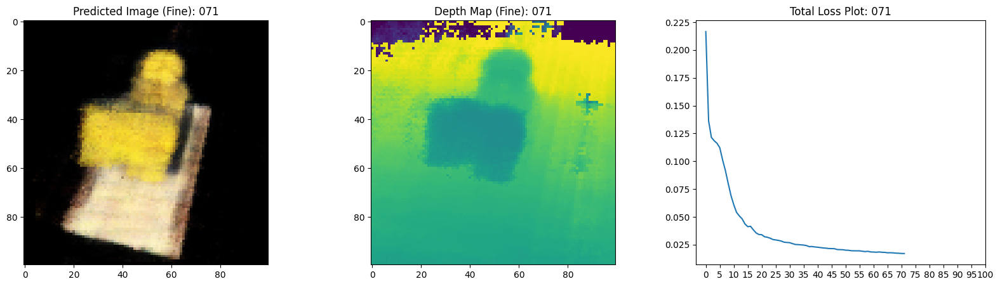

16/16 [==============================] - 6s 395ms/step - loss: 0.0172 - coarse_loss: 0.0091 - fine_loss: 0.0080 - coarse_psnr: 20.5672 - psnr: 21.0475 - val_loss: 0.0168 - val_coarse_loss: 0.0087 - val_fine_loss: 0.0081 - val_coarse_psnr: 20.7042 - val_psnr: 21.0041
Epoch 73/100
16/16 [==============================] - ETA: 0s - loss: 0.0173 - coarse_loss: 0.0090 - fine_loss: 0.0080 - coarse_psnr: 20.5831 - psnr: 20.9910

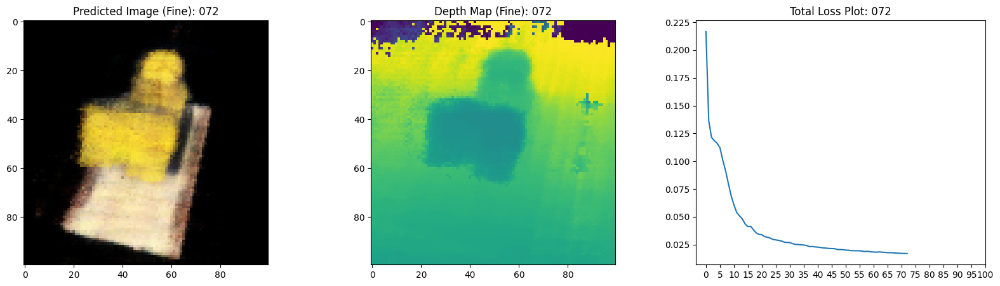

16/16 [==============================] - 6s 392ms/step - loss: 0.0173 - coarse_loss: 0.0090 - fine_loss: 0.0080 - coarse_psnr: 20.5831 - psnr: 20.9989 - val_loss: 0.0164 - val_coarse_loss: 0.0085 - val_fine_loss: 0.0079 - val_coarse_psnr: 20.8134 - val_psnr: 21.1116
Epoch 74/100
16/16 [==============================] - ETA: 0s - loss: 0.0169 - coarse_loss: 0.0089 - fine_loss: 0.0079 - coarse_psnr: 20.6650 - psnr: 21.0861

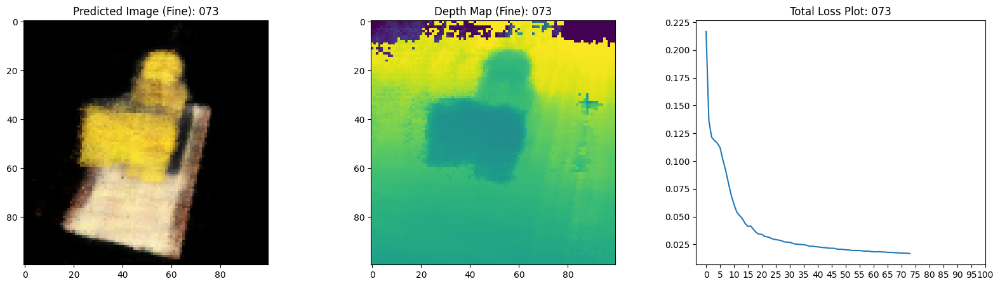

16/16 [==============================] - 6s 393ms/step - loss: 0.0169 - coarse_loss: 0.0089 - fine_loss: 0.0079 - coarse_psnr: 20.6650 - psnr: 21.0926 - val_loss: 0.0165 - val_coarse_loss: 0.0086 - val_fine_loss: 0.0079 - val_coarse_psnr: 20.7386 - val_psnr: 21.1201
Epoch 75/100
16/16 [==============================] - ETA: 0s - loss: 0.0168 - coarse_loss: 0.0089 - fine_loss: 0.0078 - coarse_psnr: 20.6436 - psnr: 21.1657

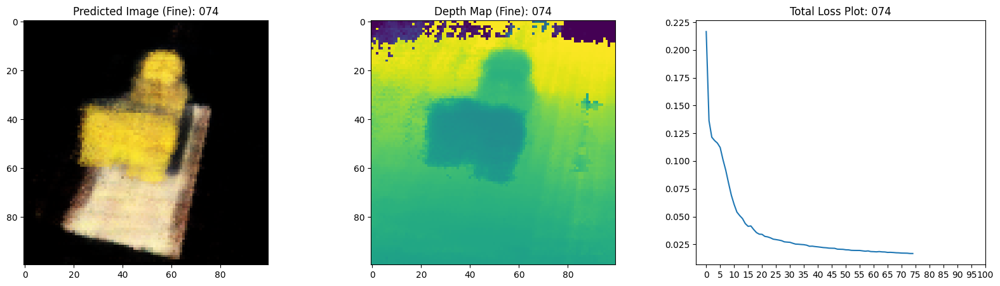

16/16 [==============================] - 6s 396ms/step - loss: 0.0168 - coarse_loss: 0.0089 - fine_loss: 0.0078 - coarse_psnr: 20.6436 - psnr: 21.1694 - val_loss: 0.0161 - val_coarse_loss: 0.0085 - val_fine_loss: 0.0077 - val_coarse_psnr: 20.8036 - val_psnr: 21.2584
Epoch 76/100
16/16 [==============================] - ETA: 0s - loss: 0.0167 - coarse_loss: 0.0087 - fine_loss: 0.0077 - coarse_psnr: 20.7261 - psnr: 21.2216

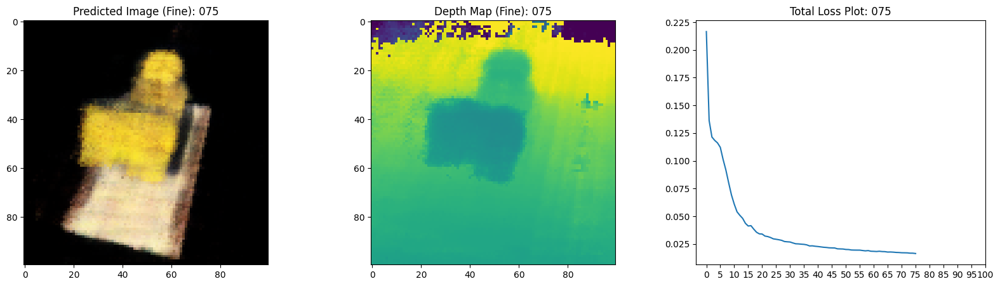

16/16 [==============================] - 6s 390ms/step - loss: 0.0166 - coarse_loss: 0.0087 - fine_loss: 0.0077 - coarse_psnr: 20.7261 - psnr: 21.2270 - val_loss: 0.0159 - val_coarse_loss: 0.0083 - val_fine_loss: 0.0075 - val_coarse_psnr: 20.9207 - val_psnr: 21.3755
Epoch 77/100
16/16 [==============================] - ETA: 0s - loss: 0.0166 - coarse_loss: 0.0087 - fine_loss: 0.0077 - coarse_psnr: 20.7661 - psnr: 21.2245

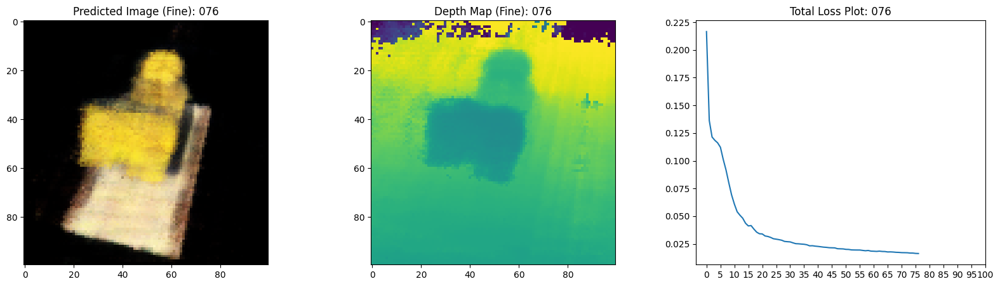

16/16 [==============================] - 6s 407ms/step - loss: 0.0166 - coarse_loss: 0.0087 - fine_loss: 0.0077 - coarse_psnr: 20.7661 - psnr: 21.2309 - val_loss: 0.0160 - val_coarse_loss: 0.0084 - val_fine_loss: 0.0076 - val_coarse_psnr: 20.8580 - val_psnr: 21.2914
Epoch 78/100
16/16 [==============================] - ETA: 0s - loss: 0.0166 - coarse_loss: 0.0087 - fine_loss: 0.0077 - coarse_psnr: 20.7265 - psnr: 21.2547

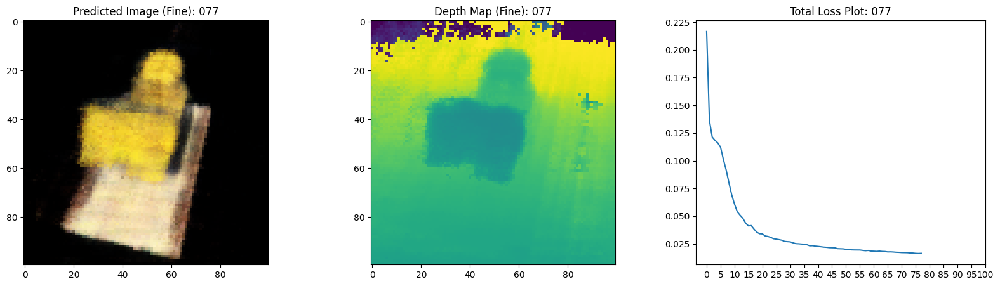

16/16 [==============================] - 6s 391ms/step - loss: 0.0166 - coarse_loss: 0.0087 - fine_loss: 0.0077 - coarse_psnr: 20.7265 - psnr: 21.2575 - val_loss: 0.0158 - val_coarse_loss: 0.0083 - val_fine_loss: 0.0075 - val_coarse_psnr: 20.9573 - val_psnr: 21.3750
Epoch 79/100
16/16 [==============================] - ETA: 0s - loss: 0.0165 - coarse_loss: 0.0086 - fine_loss: 0.0076 - coarse_psnr: 20.7898 - psnr: 21.2236

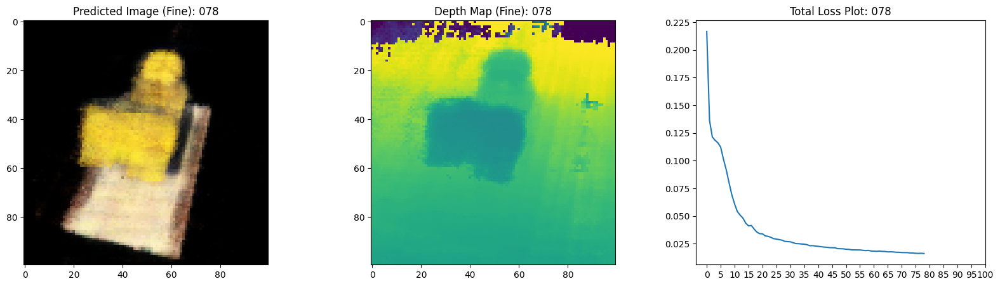

16/16 [==============================] - 6s 394ms/step - loss: 0.0165 - coarse_loss: 0.0086 - fine_loss: 0.0076 - coarse_psnr: 20.7898 - psnr: 21.2306 - val_loss: 0.0160 - val_coarse_loss: 0.0083 - val_fine_loss: 0.0076 - val_coarse_psnr: 20.8738 - val_psnr: 21.2854
Epoch 80/100
16/16 [==============================] - ETA: 0s - loss: 0.0163 - coarse_loss: 0.0087 - fine_loss: 0.0076 - coarse_psnr: 20.7760 - psnr: 21.2870

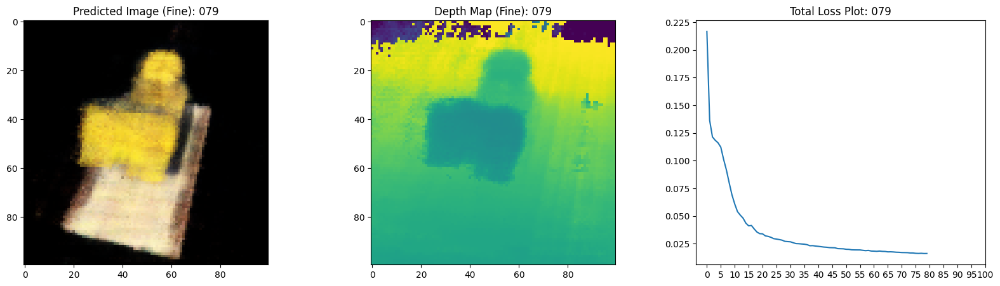

16/16 [==============================] - 6s 394ms/step - loss: 0.0163 - coarse_loss: 0.0087 - fine_loss: 0.0076 - coarse_psnr: 20.7760 - psnr: 21.2905 - val_loss: 0.0153 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0073 - val_coarse_psnr: 21.0695 - val_psnr: 21.5192
Epoch 81/100
16/16 [==============================] - ETA: 0s - loss: 0.0163 - coarse_loss: 0.0087 - fine_loss: 0.0077 - coarse_psnr: 20.7517 - psnr: 21.2965

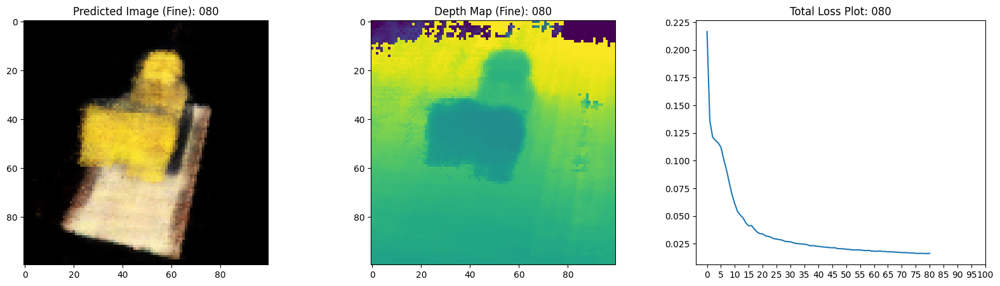

16/16 [==============================] - 6s 393ms/step - loss: 0.0163 - coarse_loss: 0.0087 - fine_loss: 0.0077 - coarse_psnr: 20.7517 - psnr: 21.2973 - val_loss: 0.0156 - val_coarse_loss: 0.0082 - val_fine_loss: 0.0074 - val_coarse_psnr: 20.9601 - val_psnr: 21.4501
Epoch 82/100
16/16 [==============================] - ETA: 0s - loss: 0.0163 - coarse_loss: 0.0085 - fine_loss: 0.0075 - coarse_psnr: 20.8471 - psnr: 21.2985

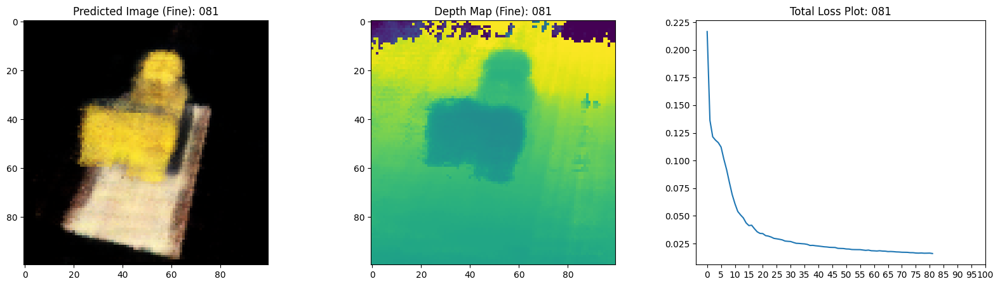

16/16 [==============================] - 6s 395ms/step - loss: 0.0163 - coarse_loss: 0.0085 - fine_loss: 0.0075 - coarse_psnr: 20.8471 - psnr: 21.3058 - val_loss: 0.0152 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0072 - val_coarse_psnr: 21.1017 - val_psnr: 21.5920
Epoch 83/100
16/16 [==============================] - ETA: 0s - loss: 0.0162 - coarse_loss: 0.0086 - fine_loss: 0.0076 - coarse_psnr: 20.8173 - psnr: 21.3559

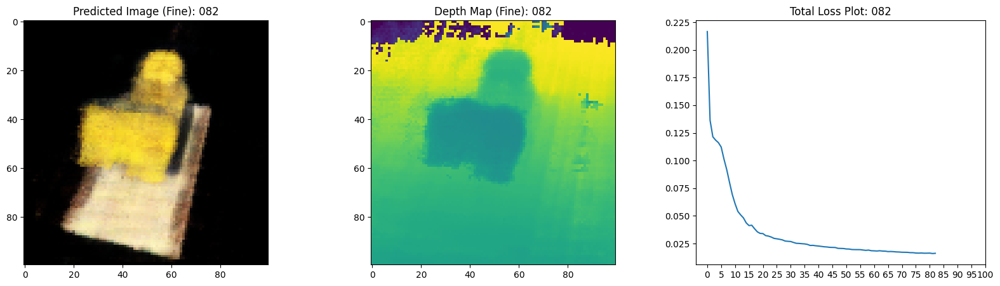

16/16 [==============================] - 6s 391ms/step - loss: 0.0162 - coarse_loss: 0.0086 - fine_loss: 0.0076 - coarse_psnr: 20.8173 - psnr: 21.3562 - val_loss: 0.0157 - val_coarse_loss: 0.0082 - val_fine_loss: 0.0075 - val_coarse_psnr: 20.9502 - val_psnr: 21.3272
Epoch 84/100
16/16 [==============================] - ETA: 0s - loss: 0.0165 - coarse_loss: 0.0084 - fine_loss: 0.0079 - coarse_psnr: 20.8743 - psnr: 21.1218

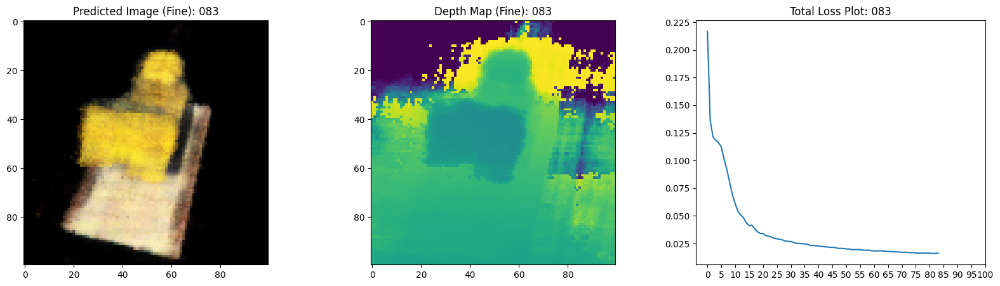

16/16 [==============================] - 6s 392ms/step - loss: 0.0165 - coarse_loss: 0.0084 - fine_loss: 0.0079 - coarse_psnr: 20.8743 - psnr: 21.1238 - val_loss: 0.0155 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0075 - val_coarse_psnr: 21.0575 - val_psnr: 21.4001
Epoch 85/100
16/16 [==============================] - ETA: 0s - loss: 0.0162 - coarse_loss: 0.0084 - fine_loss: 0.0076 - coarse_psnr: 20.9060 - psnr: 21.2936

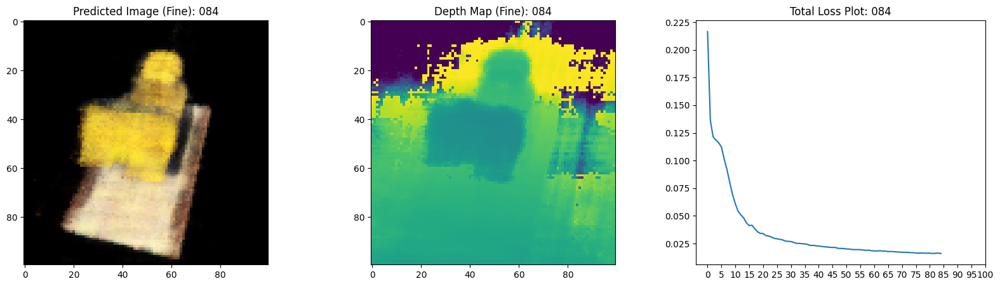

16/16 [==============================] - 6s 390ms/step - loss: 0.0162 - coarse_loss: 0.0084 - fine_loss: 0.0076 - coarse_psnr: 20.9060 - psnr: 21.2963 - val_loss: 0.0153 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0073 - val_coarse_psnr: 21.0732 - val_psnr: 21.4664
Epoch 86/100
16/16 [==============================] - ETA: 0s - loss: 0.0160 - coarse_loss: 0.0084 - fine_loss: 0.0075 - coarse_psnr: 20.9259 - psnr: 21.3808

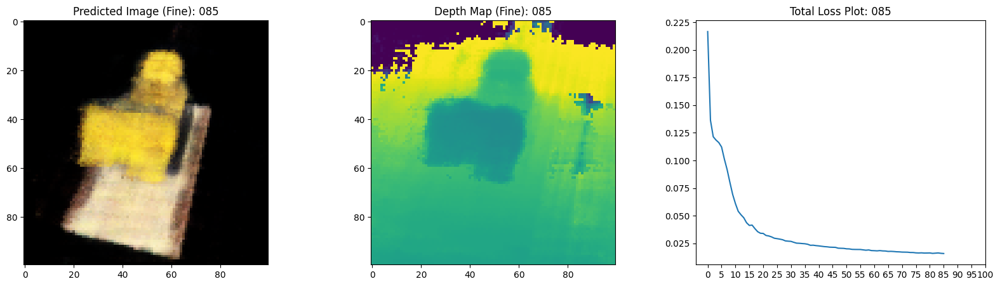

16/16 [==============================] - 6s 392ms/step - loss: 0.0159 - coarse_loss: 0.0084 - fine_loss: 0.0075 - coarse_psnr: 20.9259 - psnr: 21.3833 - val_loss: 0.0150 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0072 - val_coarse_psnr: 21.1716 - val_psnr: 21.5289
Epoch 87/100
16/16 [==============================] - ETA: 0s - loss: 0.0158 - coarse_loss: 0.0083 - fine_loss: 0.0074 - coarse_psnr: 20.9594 - psnr: 21.3934

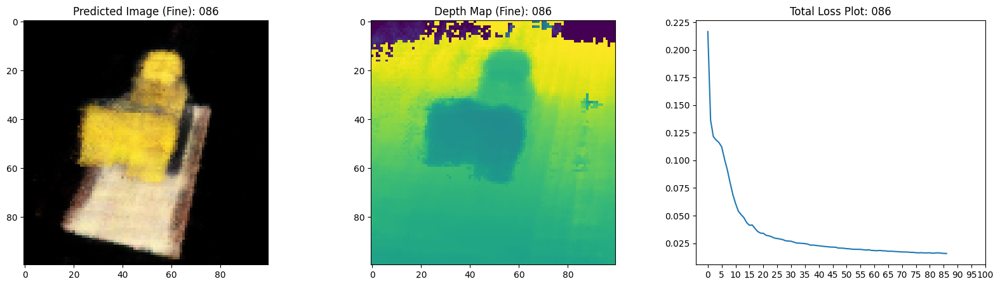

16/16 [==============================] - 6s 405ms/step - loss: 0.0158 - coarse_loss: 0.0083 - fine_loss: 0.0074 - coarse_psnr: 20.9594 - psnr: 21.3972 - val_loss: 0.0149 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0071 - val_coarse_psnr: 21.1820 - val_psnr: 21.6161
Epoch 88/100
16/16 [==============================] - ETA: 0s - loss: 0.0158 - coarse_loss: 0.0082 - fine_loss: 0.0073 - coarse_psnr: 20.9882 - psnr: 21.4317

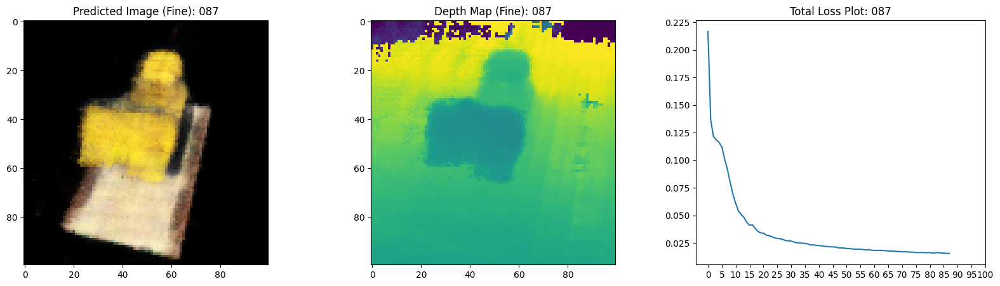

16/16 [==============================] - 6s 392ms/step - loss: 0.0158 - coarse_loss: 0.0082 - fine_loss: 0.0073 - coarse_psnr: 20.9882 - psnr: 21.4383 - val_loss: 0.0147 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0070 - val_coarse_psnr: 21.2228 - val_psnr: 21.6999
Epoch 89/100
16/16 [==============================] - ETA: 0s - loss: 0.0157 - coarse_loss: 0.0082 - fine_loss: 0.0073 - coarse_psnr: 20.9808 - psnr: 21.4794

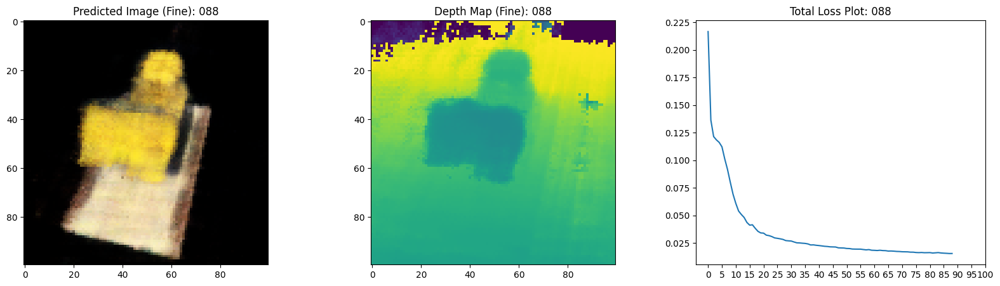

16/16 [==============================] - 6s 390ms/step - loss: 0.0157 - coarse_loss: 0.0082 - fine_loss: 0.0073 - coarse_psnr: 20.9808 - psnr: 21.4828 - val_loss: 0.0147 - val_coarse_loss: 0.0077 - val_fine_loss: 0.0070 - val_coarse_psnr: 21.2148 - val_psnr: 21.6213
Epoch 90/100
16/16 [==============================] - ETA: 0s - loss: 0.0157 - coarse_loss: 0.0083 - fine_loss: 0.0073 - coarse_psnr: 20.9654 - psnr: 21.4829

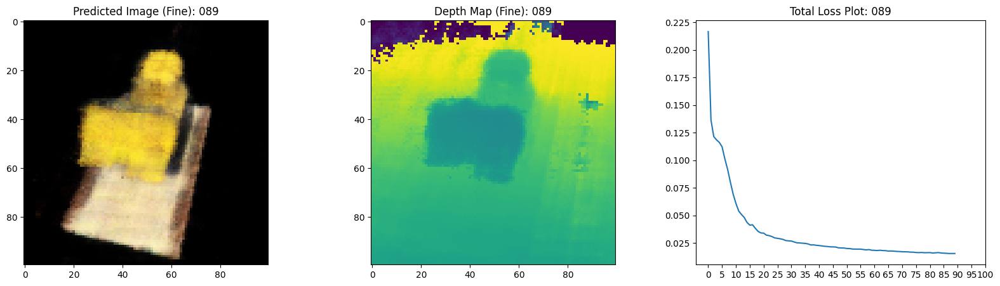

16/16 [==============================] - 6s 394ms/step - loss: 0.0157 - coarse_loss: 0.0083 - fine_loss: 0.0073 - coarse_psnr: 20.9654 - psnr: 21.4857 - val_loss: 0.0150 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0071 - val_coarse_psnr: 21.1409 - val_psnr: 21.5863
Epoch 91/100
16/16 [==============================] - ETA: 0s - loss: 0.0158 - coarse_loss: 0.0083 - fine_loss: 0.0074 - coarse_psnr: 20.9737 - psnr: 21.4225

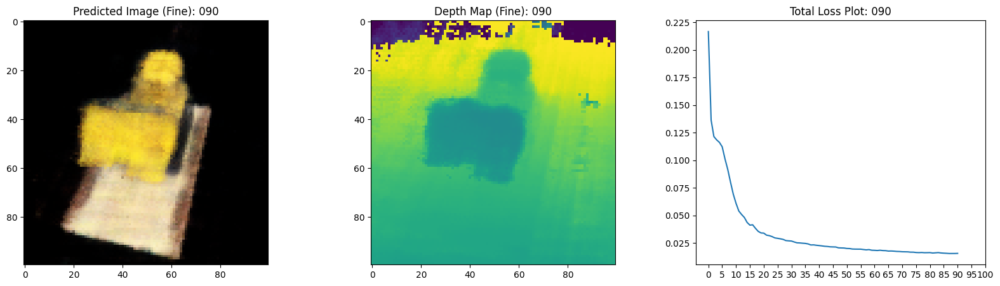

16/16 [==============================] - 6s 393ms/step - loss: 0.0158 - coarse_loss: 0.0083 - fine_loss: 0.0074 - coarse_psnr: 20.9737 - psnr: 21.4265 - val_loss: 0.0148 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0071 - val_coarse_psnr: 21.1941 - val_psnr: 21.6450
Epoch 92/100
16/16 [==============================] - ETA: 0s - loss: 0.0157 - coarse_loss: 0.0083 - fine_loss: 0.0075 - coarse_psnr: 20.9234 - psnr: 21.4417

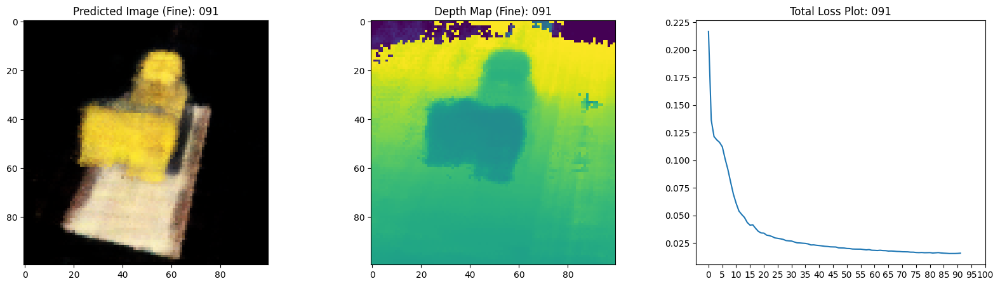

16/16 [==============================] - 6s 392ms/step - loss: 0.0157 - coarse_loss: 0.0083 - fine_loss: 0.0075 - coarse_psnr: 20.9234 - psnr: 21.4399 - val_loss: 0.0149 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0072 - val_coarse_psnr: 21.1939 - val_psnr: 21.5400
Epoch 93/100
16/16 [==============================] - ETA: 0s - loss: 0.0155 - coarse_loss: 0.0081 - fine_loss: 0.0073 - coarse_psnr: 21.0369 - psnr: 21.4515

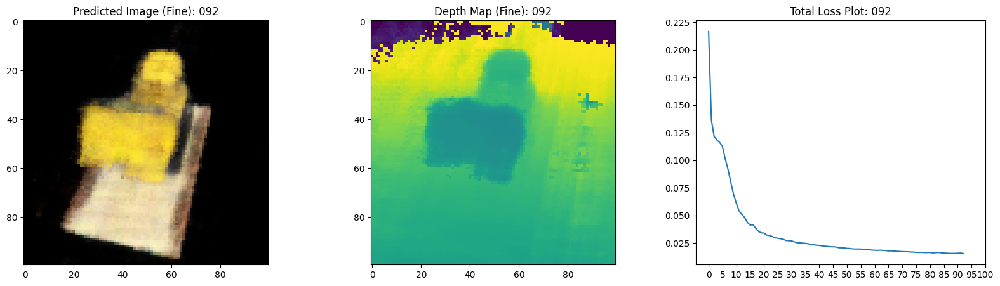

16/16 [==============================] - 6s 393ms/step - loss: 0.0155 - coarse_loss: 0.0081 - fine_loss: 0.0073 - coarse_psnr: 21.0369 - psnr: 21.4563 - val_loss: 0.0148 - val_coarse_loss: 0.0077 - val_fine_loss: 0.0071 - val_coarse_psnr: 21.2560 - val_psnr: 21.5807
Epoch 94/100
16/16 [==============================] - ETA: 0s - loss: 0.0155 - coarse_loss: 0.0081 - fine_loss: 0.0072 - coarse_psnr: 21.0279 - psnr: 21.4420

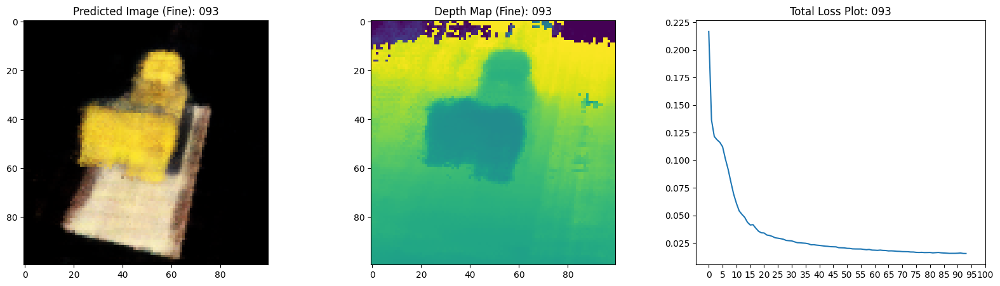

16/16 [==============================] - 6s 391ms/step - loss: 0.0155 - coarse_loss: 0.0081 - fine_loss: 0.0072 - coarse_psnr: 21.0279 - psnr: 21.4487 - val_loss: 0.0148 - val_coarse_loss: 0.0077 - val_fine_loss: 0.0071 - val_coarse_psnr: 21.2205 - val_psnr: 21.5908
Epoch 95/100
16/16 [==============================] - ETA: 0s - loss: 0.0153 - coarse_loss: 0.0081 - fine_loss: 0.0072 - coarse_psnr: 21.0718 - psnr: 21.5638

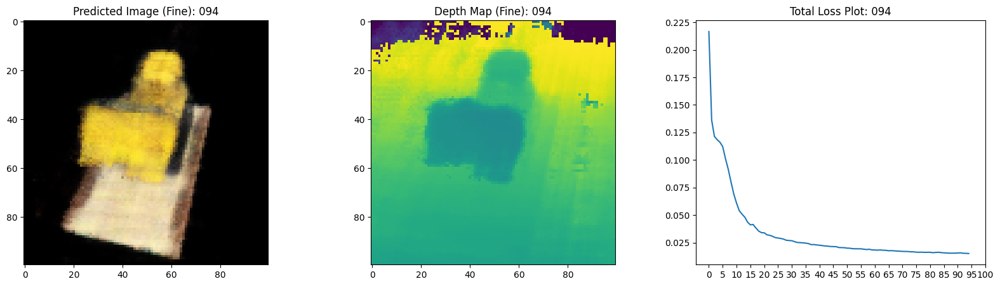

16/16 [==============================] - 6s 394ms/step - loss: 0.0153 - coarse_loss: 0.0081 - fine_loss: 0.0072 - coarse_psnr: 21.0718 - psnr: 21.5669 - val_loss: 0.0145 - val_coarse_loss: 0.0076 - val_fine_loss: 0.0069 - val_coarse_psnr: 21.2928 - val_psnr: 21.7568
Epoch 96/100
16/16 [==============================] - ETA: 0s - loss: 0.0152 - coarse_loss: 0.0080 - fine_loss: 0.0070 - coarse_psnr: 21.0984 - psnr: 21.6027

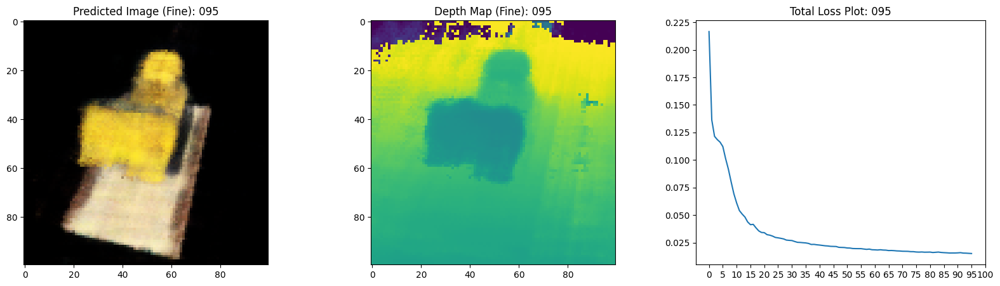

16/16 [==============================] - 6s 405ms/step - loss: 0.0152 - coarse_loss: 0.0080 - fine_loss: 0.0070 - coarse_psnr: 21.0984 - psnr: 21.6084 - val_loss: 0.0144 - val_coarse_loss: 0.0076 - val_fine_loss: 0.0068 - val_coarse_psnr: 21.3277 - val_psnr: 21.8046
Epoch 97/100
16/16 [==============================] - ETA: 0s - loss: 0.0150 - coarse_loss: 0.0080 - fine_loss: 0.0070 - coarse_psnr: 21.1121 - psnr: 21.6650

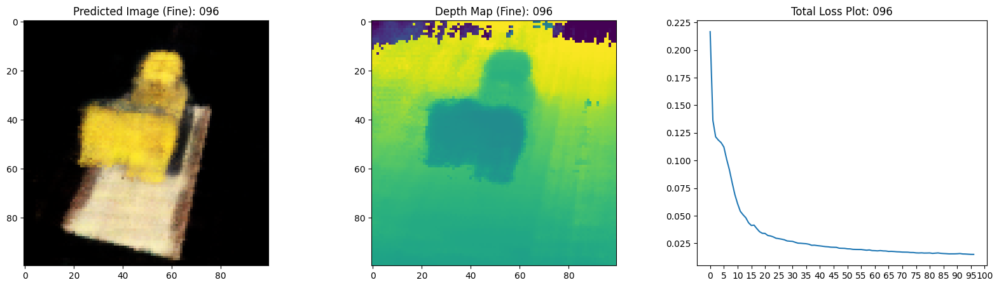

16/16 [==============================] - 6s 394ms/step - loss: 0.0150 - coarse_loss: 0.0080 - fine_loss: 0.0070 - coarse_psnr: 21.1121 - psnr: 21.6676 - val_loss: 0.0143 - val_coarse_loss: 0.0075 - val_fine_loss: 0.0068 - val_coarse_psnr: 21.3781 - val_psnr: 21.8186
Epoch 98/100
16/16 [==============================] - ETA: 0s - loss: 0.0151 - coarse_loss: 0.0081 - fine_loss: 0.0071 - coarse_psnr: 21.0551 - psnr: 21.6460

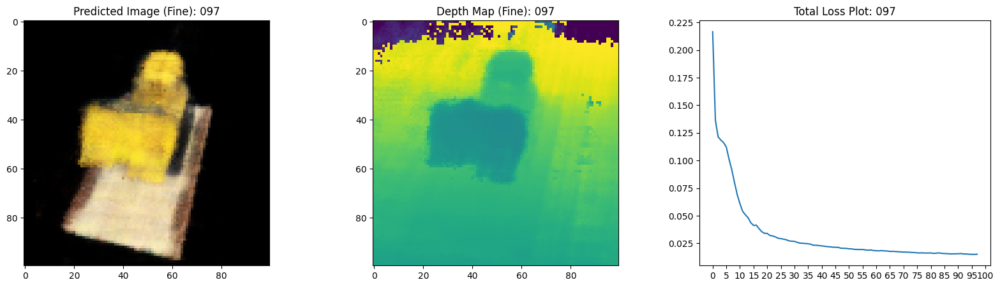

16/16 [==============================] - 6s 392ms/step - loss: 0.0151 - coarse_loss: 0.0081 - fine_loss: 0.0071 - coarse_psnr: 21.0551 - psnr: 21.6452 - val_loss: 0.0137 - val_coarse_loss: 0.0073 - val_fine_loss: 0.0065 - val_coarse_psnr: 21.4817 - val_psnr: 22.0159
Epoch 99/100
16/16 [==============================] - ETA: 0s - loss: 0.0150 - coarse_loss: 0.0079 - fine_loss: 0.0069 - coarse_psnr: 21.1454 - psnr: 21.7006

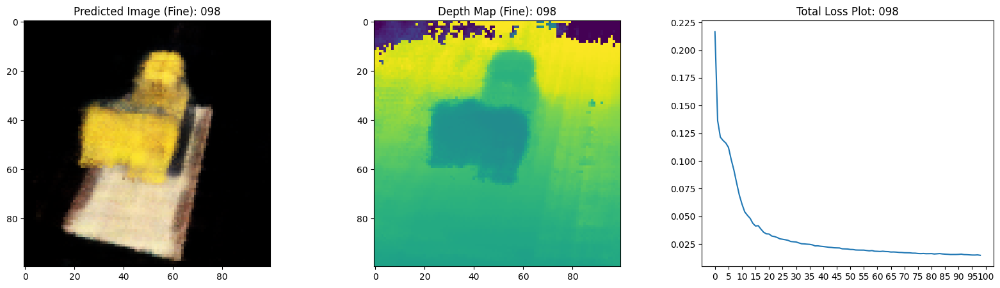

16/16 [==============================] - 6s 392ms/step - loss: 0.0150 - coarse_loss: 0.0079 - fine_loss: 0.0069 - coarse_psnr: 21.1454 - psnr: 21.7053 - val_loss: 0.0143 - val_coarse_loss: 0.0075 - val_fine_loss: 0.0068 - val_coarse_psnr: 21.3628 - val_psnr: 21.7589
Epoch 100/100
16/16 [==============================] - ETA: 0s - loss: 0.0149 - coarse_loss: 0.0079 - fine_loss: 0.0069 - coarse_psnr: 21.1853 - psnr: 21.6901

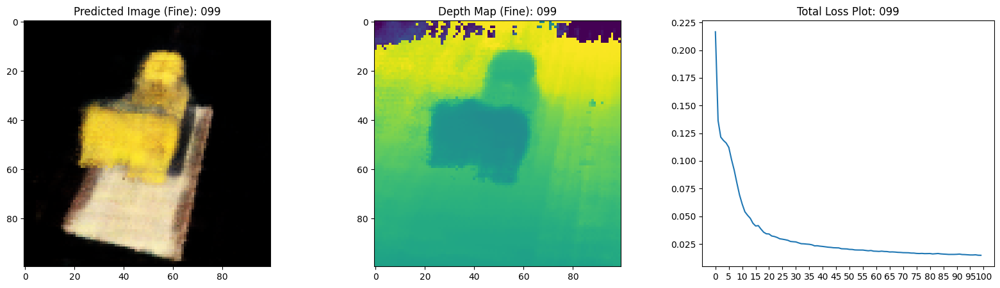

16/16 [==============================] - 6s 391ms/step - loss: 0.0149 - coarse_loss: 0.0079 - fine_loss: 0.0069 - coarse_psnr: 21.1853 - psnr: 21.6968 - val_loss: 0.0137 - val_coarse_loss: 0.0072 - val_fine_loss: 0.0065 - val_coarse_psnr: 21.5466 - val_psnr: 21.9559


100%|██████████| 100/100 [00:01<00:00, 81.88it/s]


In [6]:
class NeRF(keras.Model):
    def __init__(self, nerf_model_coarse, nerf_model_fine):
        super().__init__()
        self.nerf_model_coarse = nerf_model_coarse
        self.nerf_model_fine = nerf_model_fine

    def compile(self, optimizer_coarse, optimizer_fine, loss_fn):
        super().compile()
        self.optimizer_coarse = optimizer_coarse
        self.optimizer_fine = optimizer_fine
        self.loss_fn = loss_fn
        
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.coarse_loss_tracker = keras.metrics.Mean(name="coarse_loss")
        self.fine_loss_tracker = keras.metrics.Mean(name="fine_loss")
        self.coarse_psnr_metric = keras.metrics.Mean(name="coarse_psnr")
        self.fine_psnr_metric = keras.metrics.Mean(name="fine_psnr") # 대표 PSNR

    def train_step(self, inputs):
        (images, rays_od) = inputs # rays_od는 (ray_origins, ray_directions) 튜플
        ray_origins, ray_directions = rays_od

        with tf.GradientTape(persistent=True) as tape:
            rgb_fine, _, extras = render_rays_hierarchical( # 이전 셀에서 정의한 함수
                model_coarse=self.nerf_model_coarse,
                model_fine=self.nerf_model_fine,
                ray_origins=ray_origins,
                ray_directions=ray_directions,
                near=2.0, # 하드코딩된 값, 필요시 전역 변수 또는 인자로 변경
                far=6.0,  # 하드코딩된 값, 필요시 전역 변수 또는 인자로 변경
                perturb_coarse=True, # 학습 시에는 Coarse 샘플링도 stratified
                train=True
            )
            rgb_coarse = extras["rgb_coarse"]

            loss_coarse = self.loss_fn(images, rgb_coarse)
            loss_fine = self.loss_fn(images, rgb_fine)
            total_loss = loss_coarse + loss_fine

        # Coarse 모델 그래디언트 및 최적화
        trainable_vars_coarse = self.nerf_model_coarse.trainable_variables
        gradients_coarse = tape.gradient(total_loss, trainable_vars_coarse)
        self.optimizer_coarse.apply_gradients(zip(gradients_coarse, trainable_vars_coarse))

        # Fine 모델 그래디언트 및 최적화
        trainable_vars_fine = self.nerf_model_fine.trainable_variables
        gradients_fine = tape.gradient(total_loss, trainable_vars_fine)
        self.optimizer_fine.apply_gradients(zip(gradients_fine, trainable_vars_fine))
        
        del tape # persistent=True 사용 후 명시적 삭제

        psnr_coarse_val = tf.image.psnr(images, rgb_coarse, max_val=1.0)
        psnr_fine_val = tf.image.psnr(images, rgb_fine, max_val=1.0)

        self.total_loss_tracker.update_state(total_loss)
        self.coarse_loss_tracker.update_state(loss_coarse)
        self.fine_loss_tracker.update_state(loss_fine)
        self.coarse_psnr_metric.update_state(psnr_coarse_val)
        self.fine_psnr_metric.update_state(psnr_fine_val)
        
        return {
            "loss": self.total_loss_tracker.result(), # 대표 loss는 total로
            "coarse_loss": self.coarse_loss_tracker.result(),
            "fine_loss": self.fine_loss_tracker.result(),
            "coarse_psnr": self.coarse_psnr_metric.result(),
            "psnr": self.fine_psnr_metric.result(), # 대표 PSNR은 fine으로
        }

    def test_step(self, inputs):
        (images, rays_od) = inputs
        ray_origins, ray_directions = rays_od

        rgb_fine, _, extras = render_rays_hierarchical(
            model_coarse=self.nerf_model_coarse,
            model_fine=self.nerf_model_fine,
            ray_origins=ray_origins,
            ray_directions=ray_directions,
            near=2.0,
            far=6.0,
            perturb_coarse=False, # 평가 시에는 Coarse 샘플링도 deterministic
            train=False
        )
        rgb_coarse = extras["rgb_coarse"]
        
        loss_coarse = self.loss_fn(images, rgb_coarse)
        loss_fine = self.loss_fn(images, rgb_fine)
        total_loss = loss_coarse + loss_fine

        psnr_coarse_val = tf.image.psnr(images, rgb_coarse, max_val=1.0)
        psnr_fine_val = tf.image.psnr(images, rgb_fine, max_val=1.0)

        self.total_loss_tracker.update_state(total_loss)
        self.coarse_loss_tracker.update_state(loss_coarse)
        self.fine_loss_tracker.update_state(loss_fine)
        self.coarse_psnr_metric.update_state(psnr_coarse_val)
        self.fine_psnr_metric.update_state(psnr_fine_val)

        return {
            "loss": self.total_loss_tracker.result(),
            "coarse_loss": self.coarse_loss_tracker.result(),
            "fine_loss": self.fine_loss_tracker.result(),
            "coarse_psnr": self.coarse_psnr_metric.result(),
            "psnr": self.fine_psnr_metric.result(),
        }

    @property
    def metrics(self):
        return [
            self.total_loss_tracker, 
            self.coarse_loss_tracker, 
            self.fine_loss_tracker, 
            self.coarse_psnr_metric, 
            self.fine_psnr_metric
        ]

# TrainMonitor에서 사용할 고정된 테스트 광선 데이터 준비
# train_ds 또는 val_ds에서 한 배치를 가져옵니다.
# 이 코드는 model.fit() 호출 전에 실행되어야 합니다.
monitor_data_iter = iter(val_ds) # 검증 데이터셋 사용 권장, 없으면 train_ds
monitor_images_batch, (monitor_ray_origins_batch, monitor_ray_directions_batch) = next(monitor_data_iter)
del monitor_data_iter

loss_list = [] # TrainMonitor에서 사용

class TrainMonitor(keras.callbacks.Callback):
    def __init__(self, images_batch, ray_origins_batch, ray_directions_batch, near=2.0, far=6.0):
        super().__init__()
        self.images_batch = images_batch
        self.ray_origins_batch = ray_origins_batch
        self.ray_directions_batch = ray_directions_batch
        self.near = near
        self.far = far


    def on_epoch_end(self, epoch, logs=None):
        # logs에는 total_loss, coarse_loss, fine_loss, coarse_psnr, fine_psnr 등이 포함됨
        current_loss = logs.get("loss", None) # NeRF 모델의 'loss' metric (total_loss)
        if current_loss is not None:
            loss_list.append(current_loss)
        
        # 저장된 배치 데이터를 사용하여 이미지 생성
        recons_images_fine, depth_maps_fine, extras = render_rays_hierarchical(
            model_coarse=self.model.nerf_model_coarse, # 콜백 내에서는 self.model로 접근
            model_fine=self.model.nerf_model_fine,
            ray_origins=self.ray_origins_batch,
            ray_directions=self.ray_directions_batch,
            near=self.near, 
            far=self.far,
            perturb_coarse=False, # 시각화 시에는 deterministic
            train=False, # predict 모드
        )
        
        # Plot the rgb (fine), depth (fine) and the loss plot.
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
        ax[0].imshow(tf.keras.utils.array_to_img(recons_images_fine[0])) # 배치의 첫 번째 이미지
        ax[0].set_title(f"Predicted Image (Fine): {epoch:03d}")

        ax[1].imshow(tf.keras.utils.array_to_img(depth_maps_fine[0, ..., None]))
        ax[1].set_title(f"Depth Map (Fine): {epoch:03d}")

        if loss_list: # loss_list가 비어있지 않을 때만 plot
            ax[2].plot(loss_list)
            ax[2].set_xticks(np.arange(0, EPOCHS + 1, 5.0 if EPOCHS >=5 else 1.0))
            ax[2].set_title(f"Total Loss Plot: {epoch:03d}")

        fig.savefig(f"images/{epoch:03d}.png")
        plt.show() # 노트북에서 너무 많은 창이 뜨는 것을 방지하려면 주석 처리 권장
        plt.close(fig)


# 모델 생성
# SINGLE_COORD_ENCODED_DIMS는 이전 셀에서 정의된 전역 변수
nerf_model_coarse = get_nerf_model_modified(num_layers=8, encoded_dims_per_coord=SINGLE_COORD_ENCODED_DIMS)
nerf_model_fine = get_nerf_model_modified(num_layers=8, encoded_dims_per_coord=SINGLE_COORD_ENCODED_DIMS) # 동일 구조 사용

model = NeRF(nerf_model_coarse, nerf_model_fine)

# 옵티마이저 생성 (Coarse와 Fine에 대해 별도 또는 공유 가능)
# 여기서는 학습률이 동일한 별도의 옵티마이저 사용
optimizer_coarse = keras.optimizers.Adam(learning_rate=5e-4) # 원본 NeRF 학습률 참고
optimizer_fine = keras.optimizers.Adam(learning_rate=5e-4)

model.compile(
    optimizer_coarse=optimizer_coarse,
    optimizer_fine=optimizer_fine,
    loss_fn=keras.losses.MeanSquaredError()
)

# 이미지 저장 디렉토리 생성
if not os.path.exists("images"):
    os.makedirs("images")

# TrainMonitor 인스턴스 생성 시 준비된 데이터 전달
train_monitor_callback = TrainMonitor(
    images_batch=monitor_images_batch,
    ray_origins_batch=monitor_ray_origins_batch,
    ray_directions_batch=monitor_ray_directions_batch
)

# 모델 학습
history = model.fit(
    train_ds,
    validation_data=val_ds,
    # batch_size=BATCH_SIZE, # train_ds.batch(BATCH_SIZE)에서 이미 설정됨
    epochs=EPOCHS,
    callbacks=[train_monitor_callback], # 수정된 콜백 사용
)

# GIF 생성 함수 (변경 없음)
def create_gif(path_to_images, name_gif):
    filenames = glob.glob(path_to_images)
    filenames = sorted(filenames)
    if not filenames:
        print(f"No images found at {path_to_images} to create a GIF.")
        return
    images_for_gif = []
    for filename in tqdm(filenames):
        images_for_gif.append(imageio.imread(filename))
    kargs = {"duration": 0.25, "loop": 0} # loop=0 for infinite loop
    imageio.mimsave(name_gif, images_for_gif, "GIF", **kargs)

create_gif("images/*.png", "training_hierarchical.gif") # GIF 이름 변경

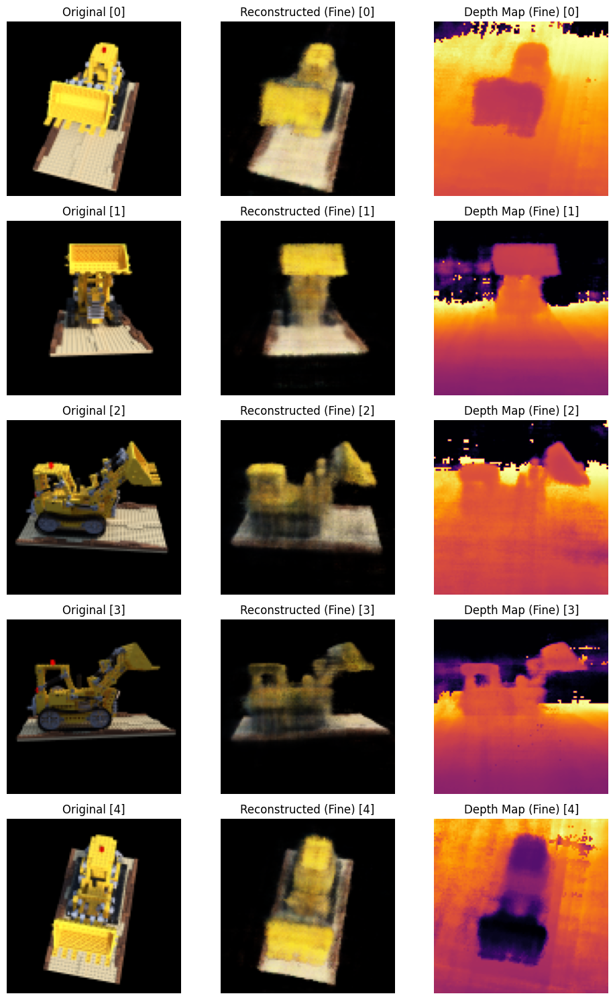

In [7]:
recons_images_fine, depth_maps_fine, extras = render_rays_hierarchical(
    model_coarse=model.nerf_model_coarse,
    model_fine=model.nerf_model_fine,
    ray_origins=monitor_ray_origins_batch,
    ray_directions=monitor_ray_directions_batch,
    near=2.0,
    far=6.0,
    perturb_coarse=False,
    train=False,
)

num_rows_to_plot = monitor_images_batch.shape[0]

fig, axes = plt.subplots(nrows=num_rows_to_plot, ncols=3, figsize=(10, 3 * num_rows_to_plot))

if num_rows_to_plot == 1:
    axes = np.array([axes])

for i in range(num_rows_to_plot):
    ax_row = axes[i]

    ori_img_np = monitor_images_batch[i].numpy()
    ax_row[0].imshow(np.clip(ori_img_np, 0.0, 1.0))
    ax_row[0].set_title(f"Original [{i}]")
    ax_row[0].axis('off')

    recons_img_fine_np = recons_images_fine[i].numpy()
    ax_row[1].imshow(np.clip(recons_img_fine_np, 0.0, 1.0))
    ax_row[1].set_title(f"Reconstructed (Fine) [{i}]")
    ax_row[1].axis('off')

    depth_map_fine_np = depth_maps_fine[i].numpy()
    ax_row[2].imshow(depth_map_fine_np, cmap="inferno")
    ax_row[2].set_title(f"Depth Map (Fine) [{i}]")
    ax_row[2].axis('off')

plt.tight_layout()
plt.show()

In [ ]:

def get_translation_t(t):
    """Get the translation matrix for movement in t."""
    matrix = [
        [1, 0, 0, 0],
        [0, 1, 0, 0],
        [0, 0, 1, t],
        [0, 0, 0, 1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)
 

def get_rotation_phi(phi):
    """Get the rotation matrix for movement in phi."""
    matrix = [
        [1, 0, 0, 0],
        [0, tf.cos(phi), -tf.sin(phi), 0],
        [0, tf.sin(phi), tf.cos(phi), 0],
        [0, 0, 0, 1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)


def get_rotation_theta(theta):
    """Get the rotation matrix for movement in theta."""
    matrix = [
        [tf.cos(theta), 0, -tf.sin(theta), 0],
        [0, 1, 0, 0],
        [tf.sin(theta), 0, tf.cos(theta), 0],
        [0, 0, 0, 1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)


def pose_spherical(theta, phi, t):
    """
    Get the camera to world matrix for the corresponding theta, phi
    and t.
    """
    c2w = get_translation_t(t)
    c2w = get_rotation_phi(phi / 180.0 * np.pi) @ c2w
    c2w = get_rotation_theta(theta / 180.0 * np.pi) @ c2w
    c2w = np.array([[-1, 0, 0, 0], [0, 0, 1, 0], [0, 1, 0, 0], [0, 0, 0, 1]]) @ c2w
    return c2w


rgb_frames = []
batch_flat = []
batch_t = []

# Iterate over different theta value and generate scenes.
for index, theta in tqdm(enumerate(np.linspace(0.0, 360.0, 120, endpoint=False))):
    # Get the camera to world matrix.
    c2w = pose_spherical(theta, -30.0, 4.0)

    #
    ray_oris, ray_dirs = get_rays(H, W, focal, c2w)
    rays_flat, t_vals = render_flat_rays(
        ray_oris, ray_dirs, near=2.0, far=6.0, num_samples=NUM_SAMPLES, rand=False
    )

    if index % BATCH_SIZE == 0 and index > 0:
        batched_flat = tf.stack(batch_flat, axis=0)
        batch_flat = [rays_flat]

        batched_t = tf.stack(batch_t, axis=0)
        batch_t = [t_vals]

        rgb, _ = render_rgb_depth(
            nerf_model, batched_flat, batched_t, rand=False, train=False
        )

        temp_rgb = [np.clip(255 * img, 0.0, 255.0).astype(np.uint8) for img in rgb]

        rgb_frames = rgb_frames + temp_rgb
    else:
        batch_flat.append(rays_flat)
        batch_t.append(t_vals)

rgb_video = "rgb_video.mp4"
imageio.mimwrite(rgb_video, rgb_frames, fps=30, quality=7, macro_block_size=None)